In [1]:
import re
import os
import glob
import time
import cv2
import pickle
import librosa
import moviepy
import numpy as np
import pandas as pd
import moviepy.editor
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.interpolate import interp1d

# Video Processing

## Basic EDA

In [139]:
video_path = glob.glob('./media/video/*/*/*')
def print_first_frame_size(video_path):
    cap = cv2.VideoCapture(video_path)
    ret, frame = cap.read()
    if ret:
        print(f"Video: {video_path}, Frame size: {frame.shape[1]}x{frame.shape[0]}")
    else:
        print(f"Unable to read video: {video_path}")
    cap.release()

for video in video_path:
    print_first_frame_size(video)

Video: ./media/video/morning/hauptplatz/IMG_1642.MOV, Frame size: 1280x720
Video: ./media/video/morning/hauptplatz/IMG_1632.MOV, Frame size: 1280x720
Video: ./media/video/morning/hauptplatz/IMG_1634.MOV, Frame size: 1920x1080
Video: ./media/video/morning/ferihumerstrasse/IMG_3212.MOV, Frame size: 1920x1080
Video: ./media/video/morning/ferihumerstrasse/IMG_3215.MOV, Frame size: 1920x1080
Video: ./media/video/morning/ferihumerstrasse/IMG_3218.MOV, Frame size: 1920x1080
Video: ./media/video/morning/sudbahnmarket/IMG_0440.MOV, Frame size: 1280x720
Video: ./media/video/morning/sudbahnmarket/IMG_0441.MOV, Frame size: 1280x720
Video: ./media/video/morning/sudbahnmarket/IMG_0439.MOV, Frame size: 1280x720
Video: ./media/video/morning/mozartkreuzung/IMG_7401.MOV, Frame size: 1920x1080
Video: ./media/video/morning/mozartkreuzung/IMG_7399.MOV, Frame size: 1920x1080
Video: ./media/video/morning/mozartkreuzung/IMG_7397.MOV, Frame size: 1920x1080
Video: ./media/video/afternoon/hauptplatz/IMG_0428_s.M

In [140]:
def print_video_details(video_path):
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    
    ret, frame = cap.read()
    if ret:
        print(f"Video: {video_path}")
        print(f"Frame size: {frame.shape[1]}x{frame.shape[0]}")
        print(f"Total frames: {total_frames}")
        print(f"FPS: {fps}")
        print("-" * 50)
    else:
        print(f"Unable to read video: {video_path}")
    cap.release()

for video in video_path:
    print_video_details(video)

Video: ./media/video/morning/hauptplatz/IMG_1642.MOV
Frame size: 1280x720
Total frames: 18053
FPS: 30
--------------------------------------------------
Video: ./media/video/morning/hauptplatz/IMG_1632.MOV
Frame size: 1280x720
Total frames: 18039
FPS: 30
--------------------------------------------------
Video: ./media/video/morning/hauptplatz/IMG_1634.MOV
Frame size: 1920x1080
Total frames: 18044
FPS: 30
--------------------------------------------------
Video: ./media/video/morning/ferihumerstrasse/IMG_3212.MOV
Frame size: 1920x1080
Total frames: 18439
FPS: 29
--------------------------------------------------
Video: ./media/video/morning/ferihumerstrasse/IMG_3215.MOV
Frame size: 1920x1080
Total frames: 18227
FPS: 29
--------------------------------------------------
Video: ./media/video/morning/ferihumerstrasse/IMG_3218.MOV
Frame size: 1920x1080
Total frames: 18246
FPS: 29
--------------------------------------------------
Video: ./media/video/morning/sudbahnmarket/IMG_0440.MOV
Fram

## District Selection

In [ ]:
We will only use 3 districts: ferihumerstrasse, hauptplatz, mozartkreuzung.
- herrenstrasse: no morning videos
- sudbahnmarket: 2 videos out of 3 were only recorded for 5 minutes

In [141]:
def average_pool(frame, pool_size=(5, 5)):
    """
    Pooling operation to downsample the frame
    """
    return cv2.resize(
        frame,
        (frame.shape[1] // pool_size[1], frame.shape[0] // pool_size[0]),
        interpolation=cv2.INTER_LINEAR,
    )

In [167]:
TARGET_FPS = 30
TARGET_DURATION = 10 * 60  # 10 minutes in seconds
TARGET_FRAMES = TARGET_FPS * TARGET_DURATION

def process_video(filename, pool_size):
    cap = cv2.VideoCapture(filename)
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Create empty lists for RGB values
    r_values, g_values, b_values = [], [], []
    
    frame_count = 0

    while frame_count < TARGET_FRAMES:
        ret, frame = cap.read()
        
        # If the video ends before the target duration, break out of the loop
        if not ret:
            break

        # Resize the frame if larger than 1280x720
        if frame.shape[1] > 1280 or frame.shape[0] > 720:
            frame = cv2.resize(frame, (1280, 720))

        # Ensure frame is of size 1280x720
        assert frame.shape[:2] == (720, 1280)

        # Average pooling
        pooled_frame = average_pool(frame, pool_size)

        # Summing RGB values
        total_b = np.sum(pooled_frame[:, :, 0])
        total_g = np.sum(pooled_frame[:, :, 1])
        total_r = np.sum(pooled_frame[:, :, 2])

        r_values.append(total_r)
        g_values.append(total_g)
        b_values.append(total_b)

        frame_count += 1

        # Handle different framerates
        if fps > TARGET_FPS:
            skip_frames = int(fps / TARGET_FPS)
            for _ in range(skip_frames - 1):
                cap.read()

    # If video is shorter than target frames, fill remaining frames
    while frame_count < TARGET_FRAMES:
        r_values.append(np.nan)
        g_values.append(np.nan)
        b_values.append(np.nan)
        frame_count += 1

    cap.release()

    df = pd.DataFrame({
        'R_values': r_values,
        'G_values': g_values,
        'B_values': b_values
    })
    
    return df

In [168]:
def transform_path(path):
    match = re.search(r'(morning|afternoon)/(\w+)/IMG_(\d{4})', path)
    
    if match:
        time_of_day, location, video_number = match.groups()
        return f"{time_of_day}_{location}_{video_number}"
    else:
        raise ValueError(f"Path '{path}' does not match the expected pattern.")

In [169]:
def save_rgb_to_pkl(df, save_path):
    df.to_pickle(f'./pkl/{save_path}.pkl')


def plot_rgb_along_timeline(df, save_path):
    plt.figure(figsize=(10, 6))
    plt.plot(df['sum_R'], "r", label="Red")
    plt.plot(df['sum_G'], "g", label="Green")
    plt.plot(df['sum_B'], "b", label="Blue")
    plt.title(f"RGB Values Sum Over Time for {save_path}")
    plt.xlabel("Frame number")
    plt.ylabel("RGB Sum")
    plt.legend()
    plt.grid(True)
    plt.savefig(f'./plt/{save_path}.png', dpi=100)
    plt.show()

In [148]:
mp4_list = glob.glob('media/video/*/*/*')
mp4_list[:5]

['media/video/morning/hauptplatz/IMG_1642.MOV',
 'media/video/morning/hauptplatz/IMG_1632.MOV',
 'media/video/morning/hauptplatz/IMG_1634.MOV',
 'media/video/morning/ferihumerstrasse/IMG_3212.MOV',
 'media/video/morning/ferihumerstrasse/IMG_3215.MOV']

In [170]:
keywords = ['ferihumerstrasse', 'hauptplatz', 'mozartkreuzung']
video_path = glob.glob('./media/video/*/*/*')
filtered_videos = [video for video in video_path if any(keyword in video for keyword in keywords)]

print(len(filtered_videos))

18


In [156]:
# save audio
# video = moviepy.editor.VideoFileClip(video_path)
# video.audio.write_audiofile(f"./media/audio/{save_path}.mp3")

### get original RGB values

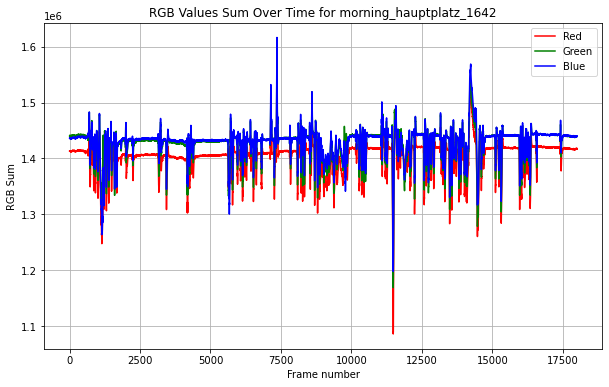

FINISHED morning_hauptplatz_1642: 1.9 [min]


KeyboardInterrupt: 

In [200]:
for video_path in filtered_videos:
    start_time = time.time()

    save_path = transform_path(video_path)
    pool_size = (10, 10)

    df = process_video(video_path, pool_size)
    save_rgb_to_pkl(df, save_path)
    plot_rgb_along_timeline(df, save_path)
    
    elapsed_time_in_minutes = (time.time() - start_time) / 60
    print(f"FINISHED {save_path}: {elapsed_time_in_minutes:.1f} [min]")

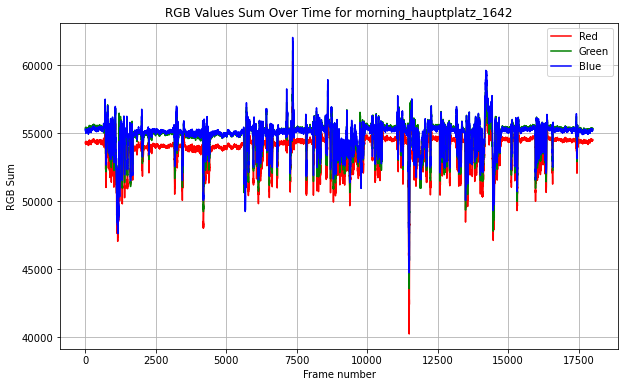

FINISHED morning_hauptplatz_1642: 2.0 [min]


KeyboardInterrupt: 

In [199]:
for video_path in filtered_videos:
    start_time = time.time()

    save_path = transform_path(video_path)
    pool_size = (50, 50)

    df = process_video(video_path, pool_size)
    save_rgb_to_pkl(df, save_path)
    plot_rgb_along_timeline(df, save_path)
    
    elapsed_time_in_minutes = (time.time() - start_time) / 60
    print(f"FINISHED {save_path}: {elapsed_time_in_minutes:.1f} [min]")

MoviePy - Writing audio in ./media/audio/morning_hauptplatz_1642.mp3


MoviePy - Done.


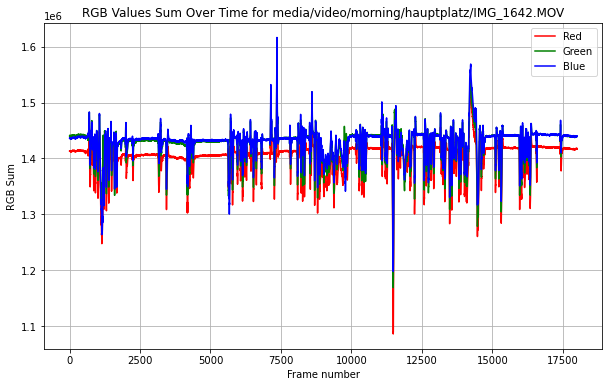

FINISHED morning_hauptplatz_1642: 120.76939797401428 [s]
MoviePy - Writing audio in ./media/audio/morning_hauptplatz_1632.mp3


MoviePy - Done.


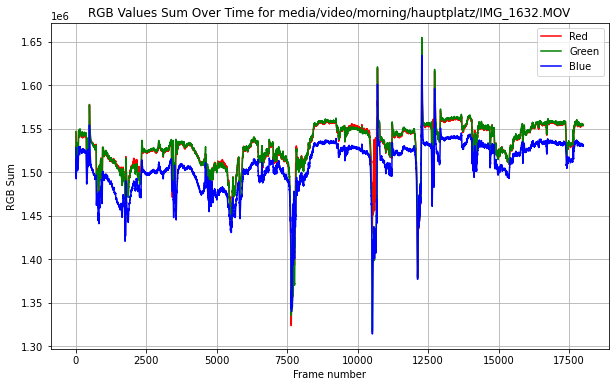

FINISHED morning_hauptplatz_1632: 121.92753720283508 [s]
MoviePy - Writing audio in ./media/audio/morning_hauptplatz_1634.mp3


MoviePy - Done.


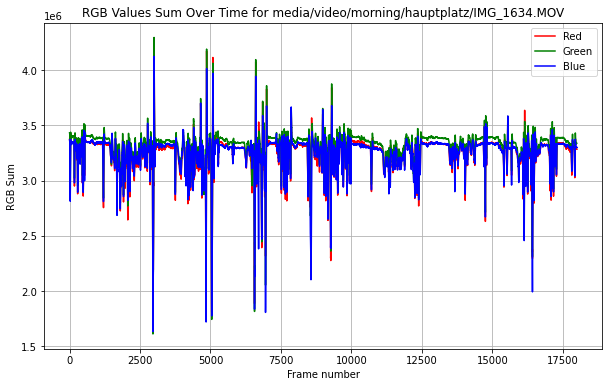

FINISHED morning_hauptplatz_1634: 266.8274908065796 [s]
MoviePy - Writing audio in ./media/audio/morning_ferihumerstrasse_3212.mp3


MoviePy - Done.


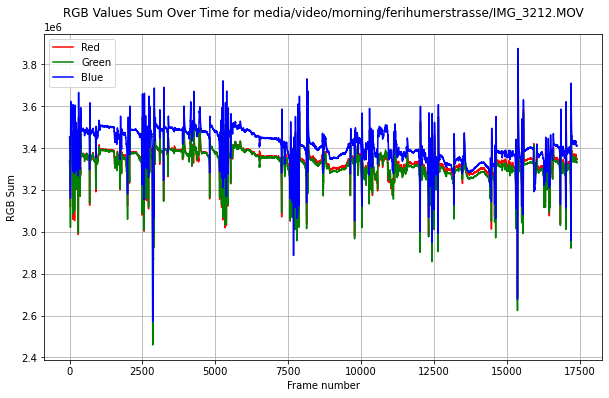

FINISHED morning_ferihumerstrasse_3212: 277.9357011318207 [s]
MoviePy - Writing audio in ./media/audio/morning_ferihumerstrasse_3215.mp3


MoviePy - Done.


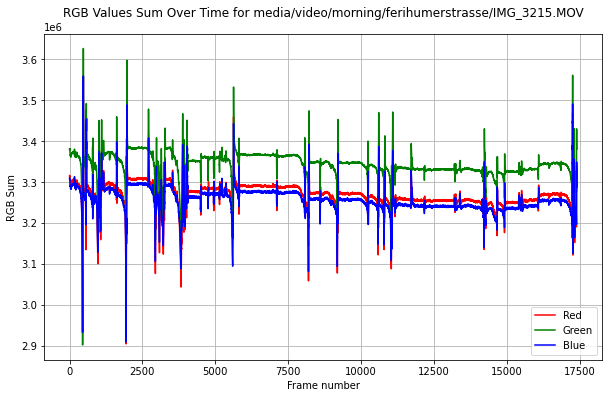

FINISHED morning_ferihumerstrasse_3215: 258.8973870277405 [s]
MoviePy - Writing audio in ./media/audio/morning_ferihumerstrasse_3218.mp3


MoviePy - Done.


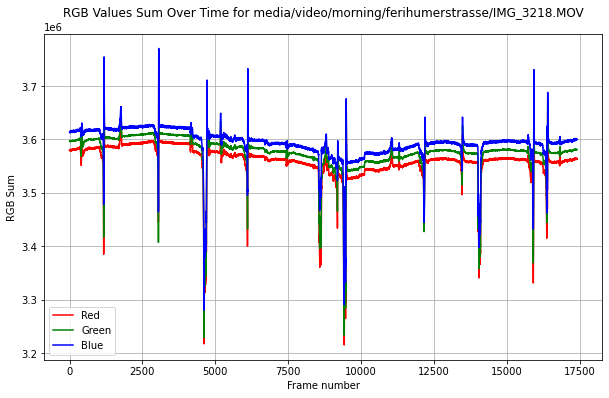

FINISHED morning_ferihumerstrasse_3218: 255.92501091957092 [s]
MoviePy - Writing audio in ./media/audio/morning_sudbahnmarket_0440.mp3


MoviePy - Done.


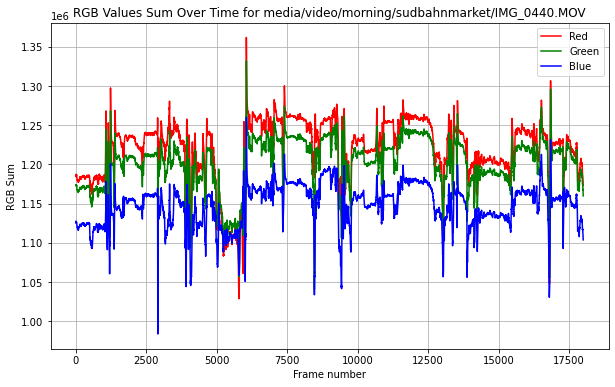

FINISHED morning_sudbahnmarket_0440: 34.811222076416016 [s]
MoviePy - Writing audio in ./media/audio/morning_sudbahnmarket_0441.mp3


MoviePy - Done.


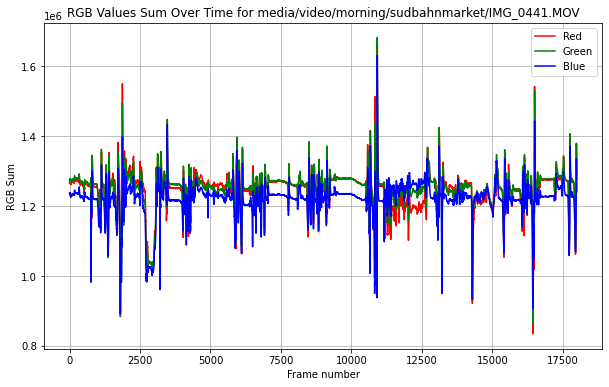

FINISHED morning_sudbahnmarket_0441: 34.06256318092346 [s]
MoviePy - Writing audio in ./media/audio/morning_sudbahnmarket_0439.mp3


MoviePy - Done.


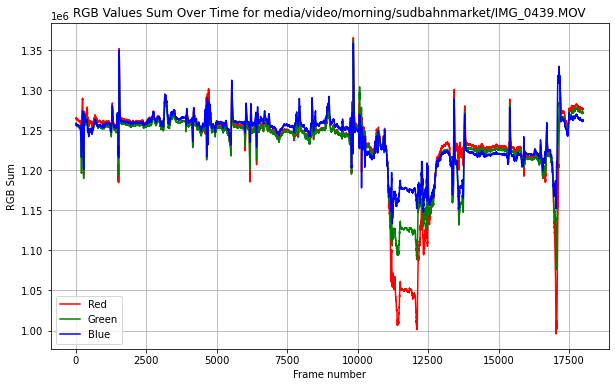

FINISHED morning_sudbahnmarket_0439: 33.51323485374451 [s]
MoviePy - Writing audio in ./media/audio/morning_mozartkreuzung_7401.mp3


MoviePy - Done.


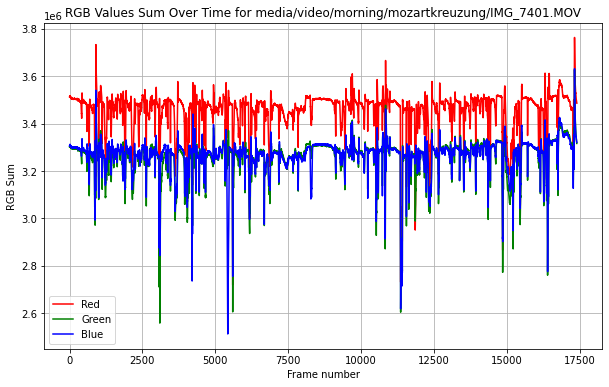

FINISHED morning_mozartkreuzung_7401: 254.69329476356506 [s]
MoviePy - Writing audio in ./media/audio/morning_mozartkreuzung_7399.mp3


MoviePy - Done.


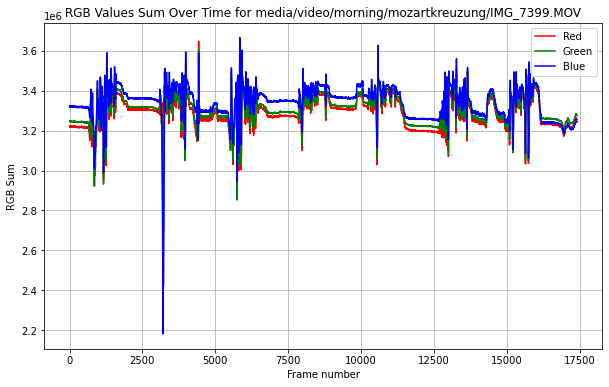

FINISHED morning_mozartkreuzung_7399: 260.51211404800415 [s]
MoviePy - Writing audio in ./media/audio/morning_mozartkreuzung_7397.mp3


MoviePy - Done.


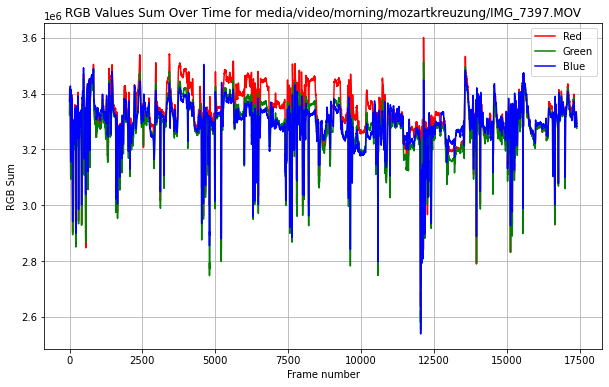

FINISHED morning_mozartkreuzung_7397: 263.2541711330414 [s]
MoviePy - Writing audio in ./media/audio/afternoon_hauptplatz_0428.mp3


MoviePy - Done.


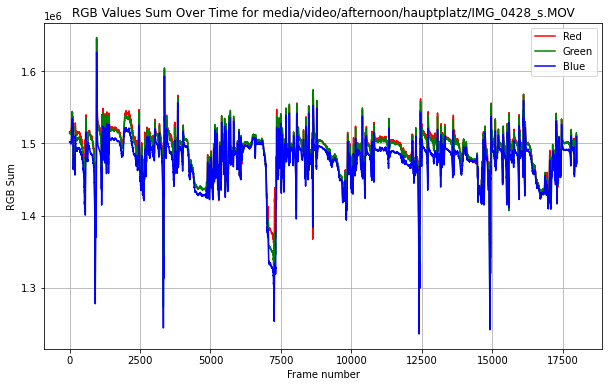

FINISHED afternoon_hauptplatz_0428: 119.80751371383667 [s]
MoviePy - Writing audio in ./media/audio/afternoon_hauptplatz_0431.mp3


MoviePy - Done.


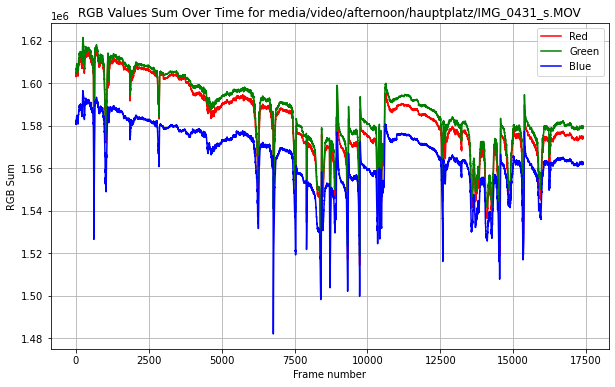

FINISHED afternoon_hauptplatz_0431: 112.81452584266663 [s]
MoviePy - Writing audio in ./media/audio/afternoon_hauptplatz_0418.mp3


MoviePy - Done.


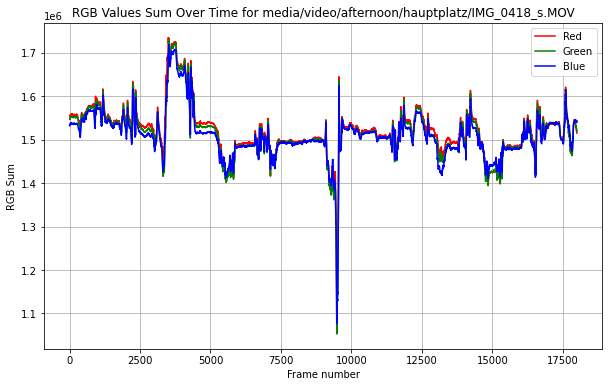

FINISHED afternoon_hauptplatz_0418: 115.5224027633667 [s]
MoviePy - Writing audio in ./media/audio/afternoon_ferihumerstrasse_1667.mp3


MoviePy - Done.


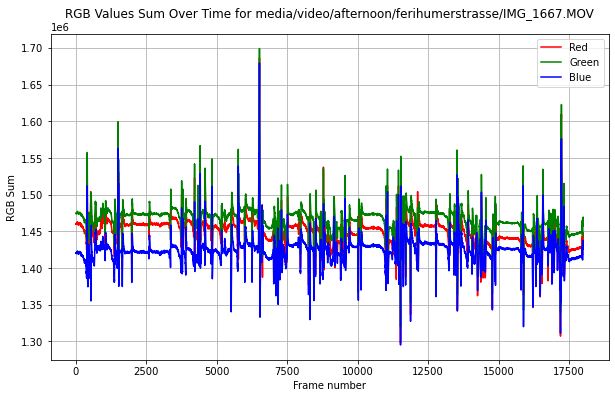

FINISHED afternoon_ferihumerstrasse_1667: 119.45214009284973 [s]
MoviePy - Writing audio in ./media/audio/afternoon_ferihumerstrasse_1671.mp3


MoviePy - Done.


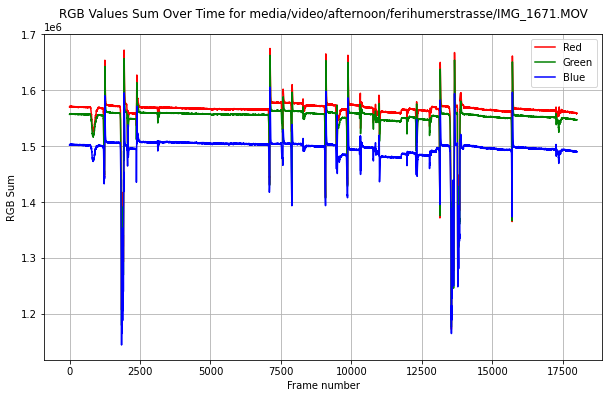

FINISHED afternoon_ferihumerstrasse_1671: 118.99485492706299 [s]
MoviePy - Writing audio in ./media/audio/afternoon_ferihumerstrasse_1663.mp3


MoviePy - Done.


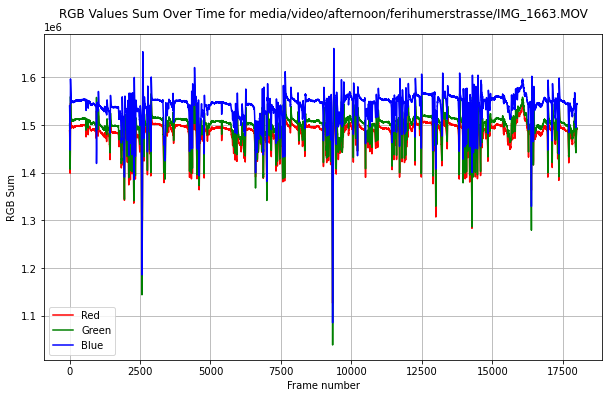

FINISHED afternoon_ferihumerstrasse_1663: 118.26013374328613 [s]
MoviePy - Writing audio in ./media/audio/afternoon_herrenstrasse_0446.mp3


MoviePy - Done.


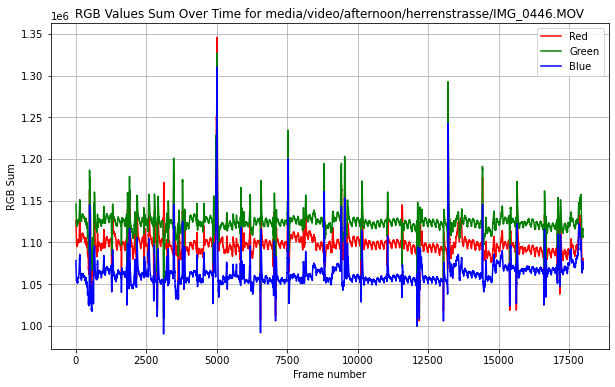

FINISHED afternoon_herrenstrasse_0446: 36.354281187057495 [s]
MoviePy - Writing audio in ./media/audio/afternoon_herrenstrasse_0450.mp3


MoviePy - Done.


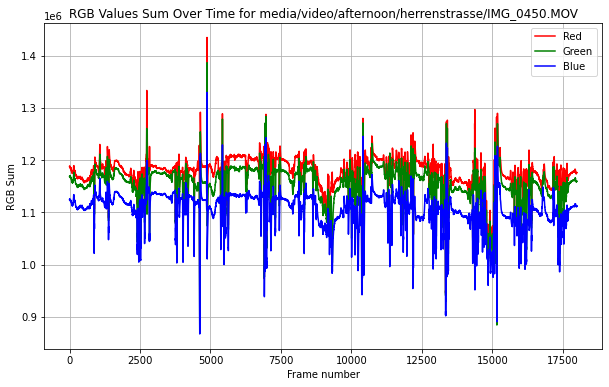

FINISHED afternoon_herrenstrasse_0450: 32.388309955596924 [s]
MoviePy - Writing audio in ./media/audio/afternoon_herrenstrasse_0448.mp3


MoviePy - Done.


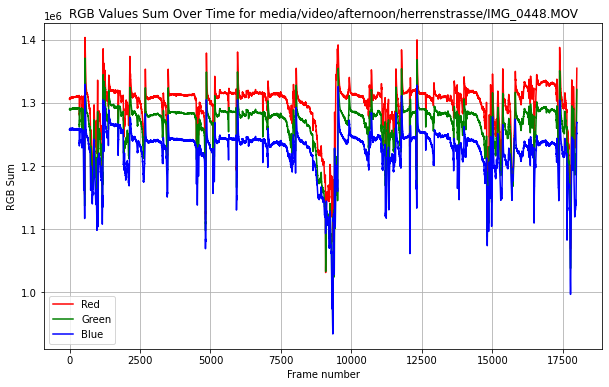

FINISHED afternoon_herrenstrasse_0448: 34.265933990478516 [s]
MoviePy - Writing audio in ./media/audio/afternoon_sudbahnmarket_5375.mp3


MoviePy - Done.


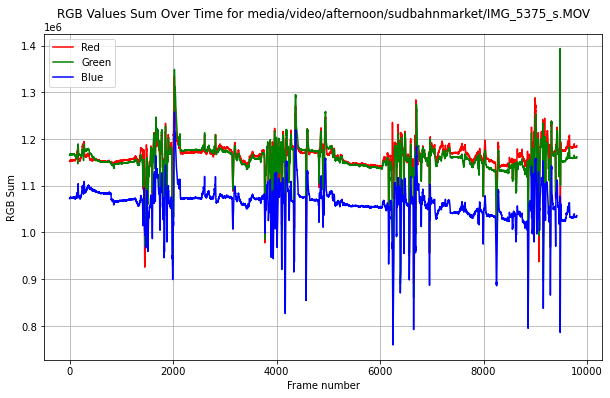

FINISHED afternoon_sudbahnmarket_5375: 16.331305027008057 [s]
MoviePy - Writing audio in ./media/audio/afternoon_sudbahnmarket_5377.mp3


MoviePy - Done.


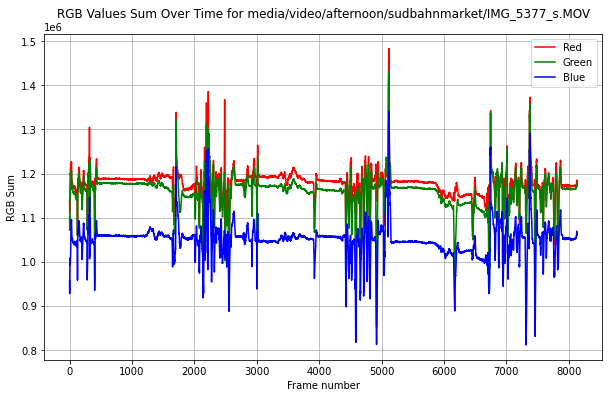

FINISHED afternoon_sudbahnmarket_5377: 13.679541110992432 [s]
MoviePy - Writing audio in ./media/audio/afternoon_sudbahnmarket_5378.mp3


MoviePy - Done.


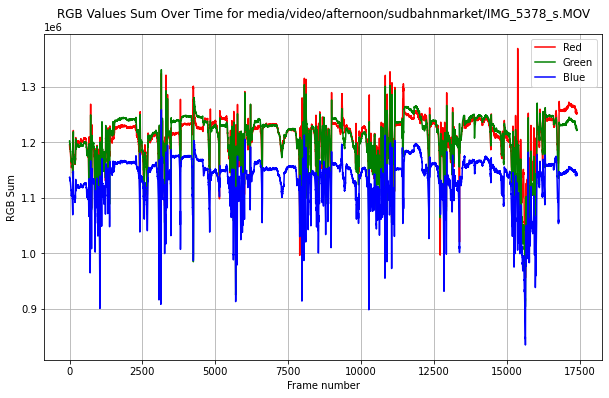

FINISHED afternoon_sudbahnmarket_5378: 29.111518144607544 [s]
MoviePy - Writing audio in ./media/audio/afternoon_mozartkreuzung_3233.mp3


MoviePy - Done.


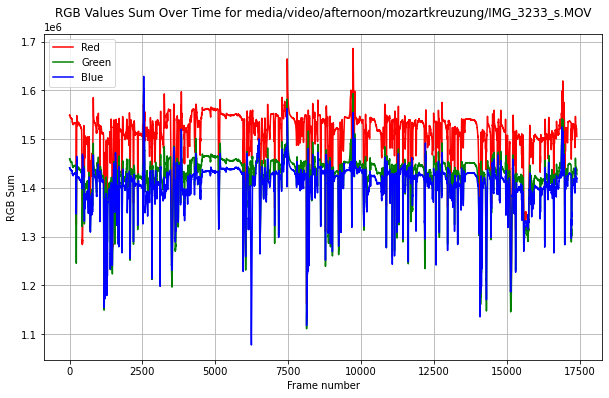

FINISHED afternoon_mozartkreuzung_3233: 112.28424191474915 [s]
MoviePy - Writing audio in ./media/audio/afternoon_mozartkreuzung_3225.mp3


MoviePy - Done.


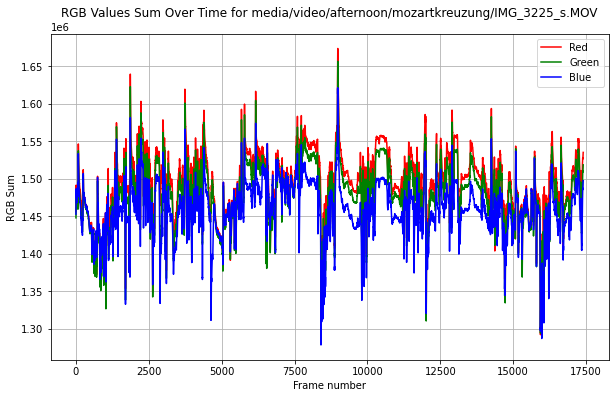

FINISHED afternoon_mozartkreuzung_3225: 112.83352208137512 [s]
MoviePy - Writing audio in ./media/audio/afternoon_mozartkreuzung_3227.mp3


MoviePy - Done.


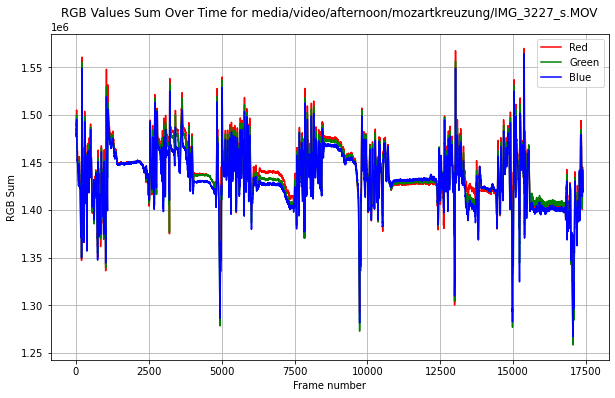

FINISHED afternoon_mozartkreuzung_3227: 113.34276914596558 [s]


In [85]:
for video_path in filtered_videos:
    start_time = time.time()

    save_path = transform_path(video_path)
    pool_size = (10, 10)

    df = process_video(video_path, pool_size)
    save_rgb_to_pkl(df, save_path)
    plot_rgb_along_timeline(df, video_path, save_path)
    
    elapsed_time_in_minutes = (time.time() - start_time) / 60
    print(f"FINISHED {save_path}: {elapsed_time_in_minutes:.1f} [min]")

# Normalize RGB

In [172]:
def normalize(df):
    for channel in ['sum_R', 'sum_G', 'sum_B']:
        min_val = df[channel].min()
        max_val = df[channel].max()
        df[channel] = 255 * (df[channel] - min_val) / (max_val - min_val)
    return df

In [212]:
def process_normalization(paths, time_period):
    combined_data = pd.DataFrame()

    # Load all the RGB values into a combined DataFrame
    for path in paths:
        with open(path, 'rb') as f:
            df = pickle.load(f)
            combined_data = pd.concat([combined_data, df], ignore_index=True)

    # Find global min and max values for each channel
    global_min_R = combined_data['sum_R'].min()
    global_max_R = combined_data['sum_R'].max()
    global_min_G = combined_data['sum_G'].min()
    global_max_G = combined_data['sum_G'].max()
    global_min_B = combined_data['sum_B'].min()
    global_max_B = combined_data['sum_B'].max()

    # Normalize each DataFrame and save to a new file
    for path in paths:
        with open(path, 'rb') as f:
            df = pickle.load(f)

        for channel, global_min, global_max in [('sum_R', global_min_R, global_max_R), 
                                                ('sum_G', global_min_G, global_max_G), 
                                                ('sum_B', global_min_B, global_max_B)]:
            df[channel] = 255 * (df[channel] - global_min) / (global_max - global_min)

        save_path = os.path.join('./pkl/norm', os.path.basename(path))
        with open(save_path, 'wb') as f:
            pickle.dump(df, f)

In [213]:
paths = glob.glob('./pkl/*')

# Group the paths by morning and afternoon
morning_paths = [path for path in paths if 'morning' in path]
afternoon_paths = [path for path in paths if 'afternoon' in path]

# Process each group
process_normalization(morning_paths, 'morning')
process_normalization(afternoon_paths, 'afternoon')

# EDA audio track

In [177]:
audio_path = glob.glob('./media/audio/*')
audio_path

['./media/audio/afternoon_herrenstrasse_0450.mp3',
 './media/audio/morning_ferihumerstrasse_3212.mp3',
 './media/audio/afternoon_hauptplatz_0418.mp3',
 './media/audio/afternoon_herrenstrasse_0446.mp3',
 './media/audio/afternoon_hauptplatz_0431.mp3',
 './media/audio/morning_hauptplatz_1634.mp3',
 './media/audio/morning_ferihumerstrasse_3215.mp3',
 './media/audio/morning_hauptplatz_1632.mp3',
 './media/audio/morning_hauptplatz_1642.mp3',
 './media/audio/afternoon_sudbahnmarket_5378.mp3',
 './media/audio/morning_sudbahnmarket_0439.mp3',
 './media/audio/morning_mozartkreuzung_7397.mp3',
 './media/audio/afternoon_sudbahnmarket_5377.mp3',
 './media/audio/morning_mozartkreuzung_7401.mp3',
 './media/audio/afternoon_sudbahnmarket_5375.mp3',
 './media/audio/morning_mozartkreuzung_7399.mp3',
 './media/audio/morning_sudbahnmarket_0440.mp3',
 './media/audio/morning_sudbahnmarket_0441.mp3',
 './media/audio/afternoon_ferihumerstrasse_1671.mp3',
 './media/audio/afternoon_ferihumerstrasse_1667.mp3',
 '

In [181]:
audio_path = glob.glob('./media/audio/*')
filtered_audios = [audio for audio in audio_path if any(keyword in audio for keyword in keywords)]

print(len(filtered_audios))

18


In [196]:
def audio_process(audio_path):
    y, sr = librosa.load(audio_path, duration=10 * 60)
    
    # Compute RMS energy
    rms = librosa.feature.rms(y=y)[0]
    # Create an interpolation function for RMS
    x = np.linspace(0, len(rms), len(rms))
    # Compute Zero-Crossing Rate
    zcr = librosa.feature.zero_crossing_rate(y)[0]

    f_rms = interp1d(x, rms)
    f_zcr = interp1d(x, zcr)
    # Create an interpolation function for ZCR
    x_new = np.linspace(0, len(rms) - 1, 18000)
    rms_downsampled = f_rms(x_new)
    zcr_downsampled = f_zcr(x_new)

    # Convert RMS energy to DataFrame and save as .pkl
    audio_name = audio_path.split('/')[-1].replace('.mp3', '')
    rms_df = pd.DataFrame(rms_downsampled, columns=['RMS'])
    rms_df.to_pickle(f'./pkl/rms_{audio_name}.pkl')
    
    # Convert Zero-Crossing Rate to DataFrame and save as .pkl
    zcr_df = pd.DataFrame(zcr_downsampled, columns=['ZCR'])
    zcr_df.to_pickle(f'./pkl/zcr_{audio_name}.pkl')

    # Plot
    plt.figure(figsize=(12, 6))
    times = librosa.times_like(rms, sr=sr)  # Generate time axis
    
    plt.subplot(2, 1, 1)
    plt.plot(times, rms, label='RMS Energy', color='r')
    plt.ylabel('RMS Energy')
    plt.legend(loc='upper right')
    
    plt.subplot(2, 1, 2)
    plt.plot(times, zcr, label='Zero-Crossing Rate', color='b')
    plt.ylabel('Zero-Crossing Rate')
    plt.legend(loc='upper right')
    plt.xlabel('Time (s)')
    
    plt.tight_layout()
    os.makedirs('./plt/audio_process', exist_ok=True)
    plt.savefig(f'./plt/audio_process/{audio_name}.png', dpi=100)
    plt.show()

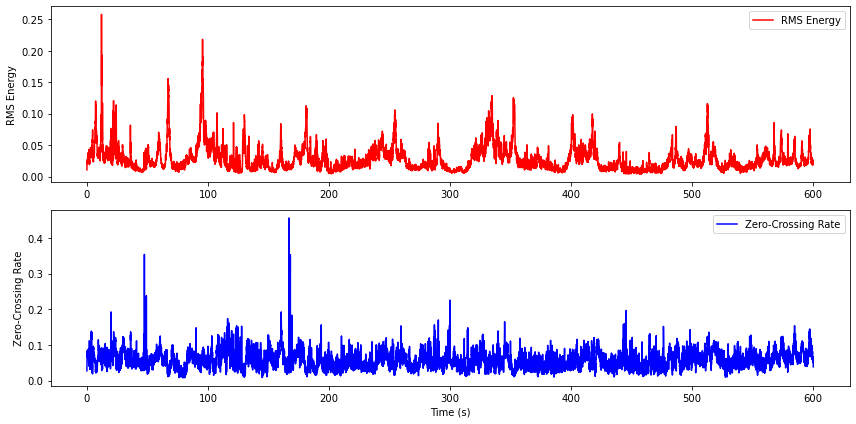

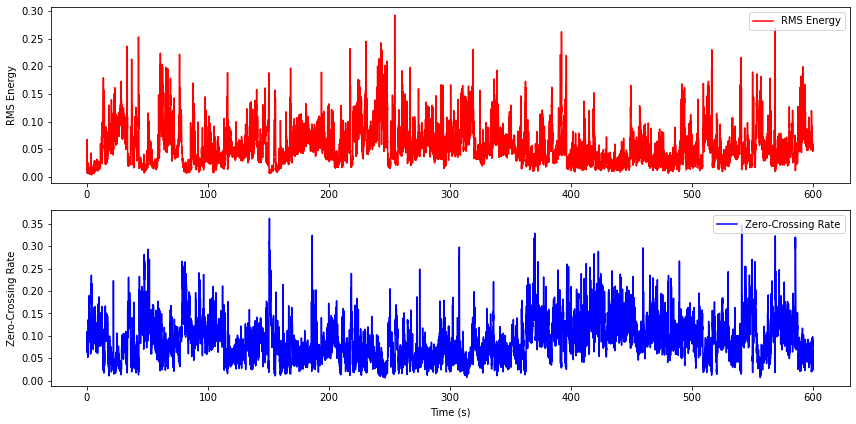

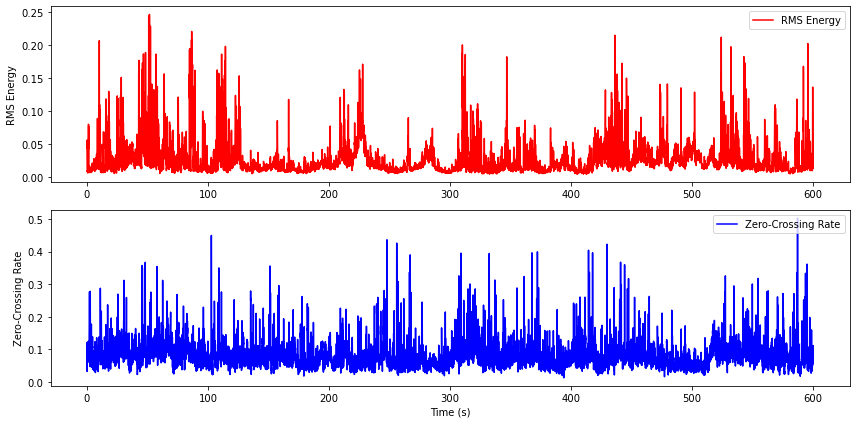

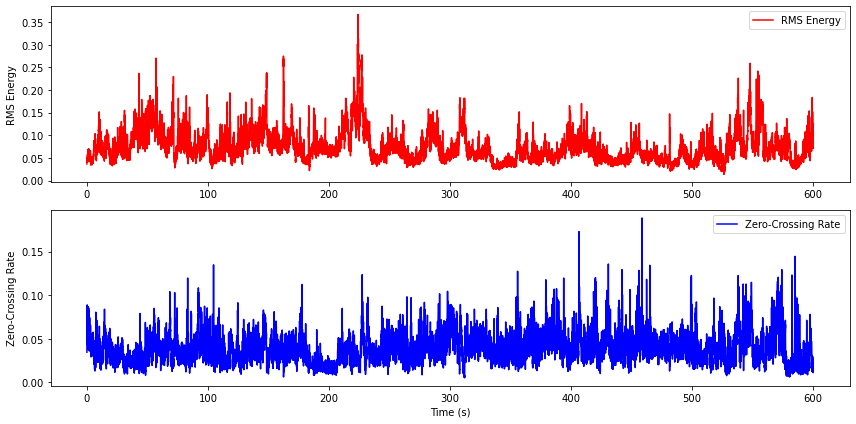

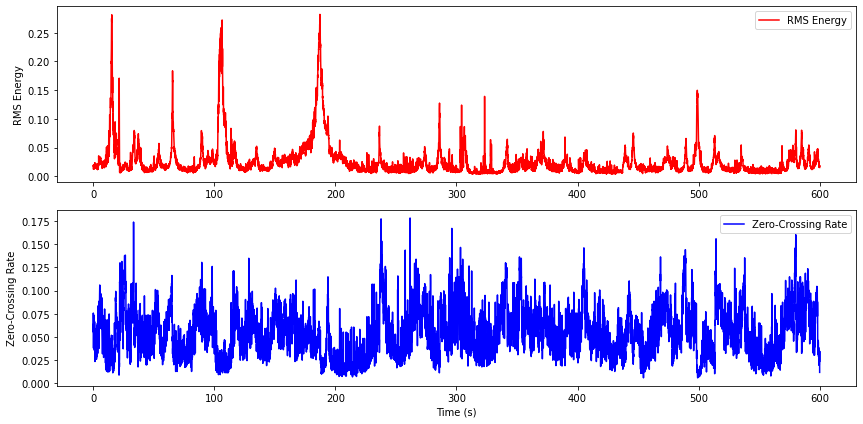

...

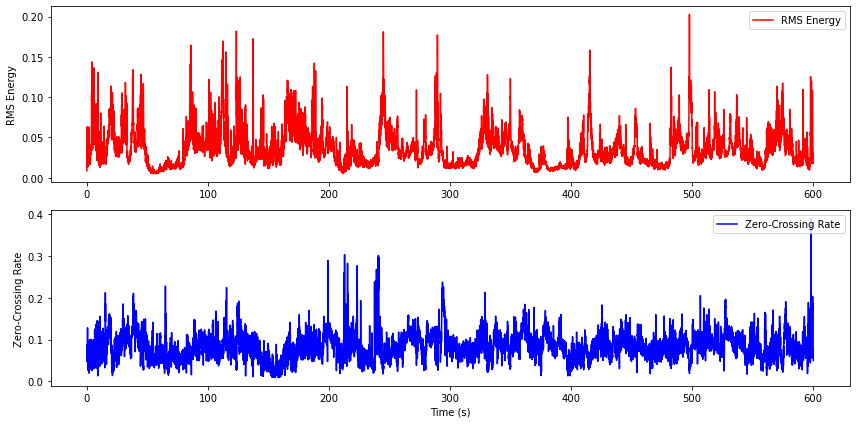

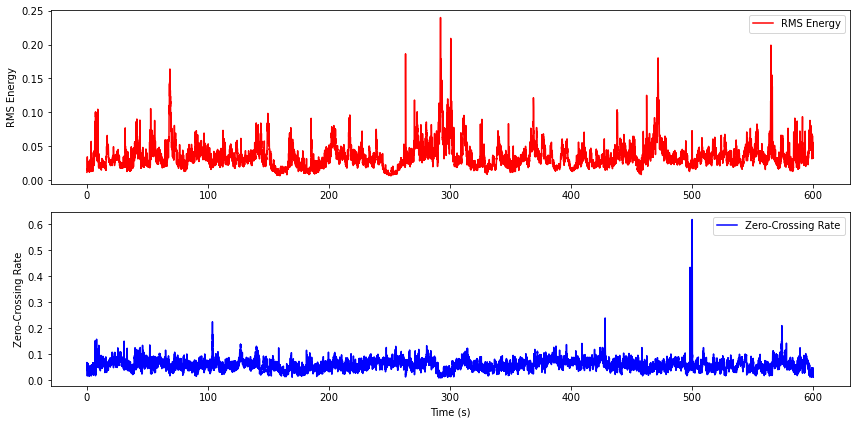

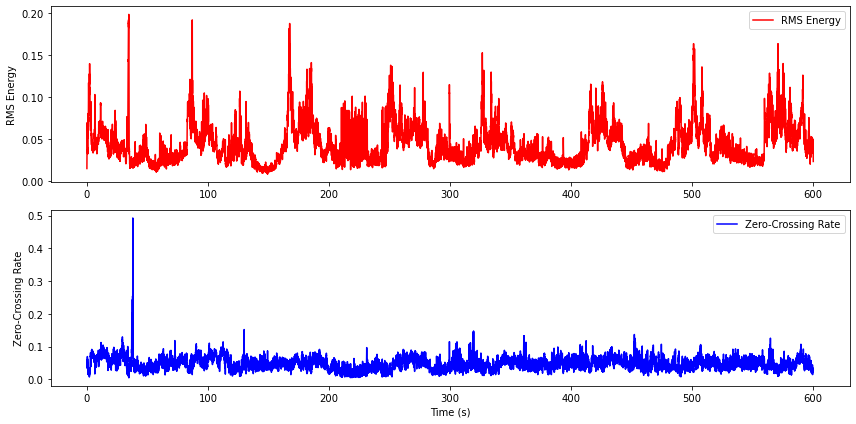

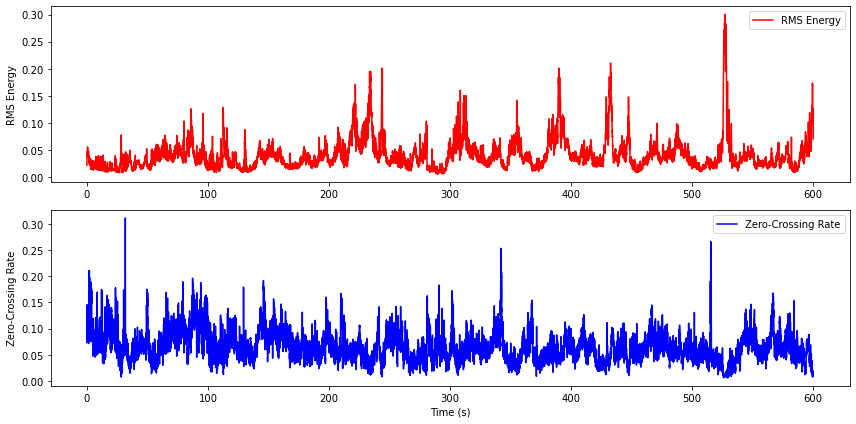

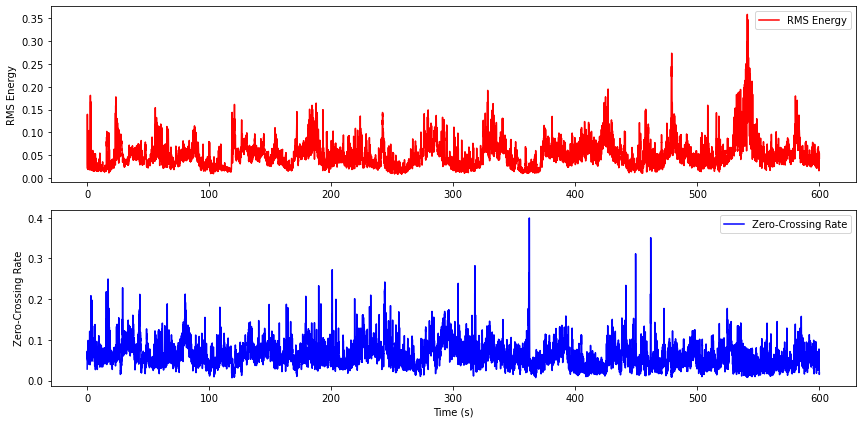

In [197]:
for f in filtered_audios:
    audio_process(f)

# audio + RGB

In [311]:
def combine_arrays(arr1, arr2, method="geometric"):
    """
    Combine two arrays using the specified method.
    arr1 is expected to have a shape (N, 3)
    arr2 is expected to have a shape (N, 1)
    
    Parameters:
    - arr1: The input array with RGB channels.
    - arr2: The input array of a single channel.
    - method: The method to use for combining ('geometric' or 'harmonic').

    Returns:
    - Combined array of shape (N, 3).
    """
    if len(arr1) != len(arr2):
        raise ValueError("The two arrays must have the same number of rows.")

    combined = np.zeros_like(arr1)

    for i in range(arr1.shape[1]): # iterate over RGB channels
        if method == "geometric":
            combined[:, i] = np.sqrt(np.multiply(arr1[:, i], arr2[:, 0]))
        elif method == "harmonic":
            epsilon = 1e-10
            combined[:, i] = 2 / (1 / (arr1[:, i] + epsilon) + 1 / (arr2[:, 0] + epsilon))
        else:
            raise ValueError("Invalid method. Choose 'geometric' or 'harmonic'.")

    return combined


def combine_dataframes(df_rgb, df_audio, method="geometric"):
    """
    Parameters:
    - df_rgb: DataFrame containing RGB values.
    - df_audio: DataFrame containing another single channel data.

    Returns:
    - DataFrame with combined values for each RGB channel.
    """
    if len(df_rgb) != len(df_audio):
        raise ValueError("Both dataframes must have the same number of rows.")

    combined_data = combine_arrays(df_rgb.values, df_audio.values, method=method)

    combined_df = pd.DataFrame(combined_data, columns=df_rgb.columns)
    return combined_df

# get one color for each frame

## It will be done by Morning (i hope)

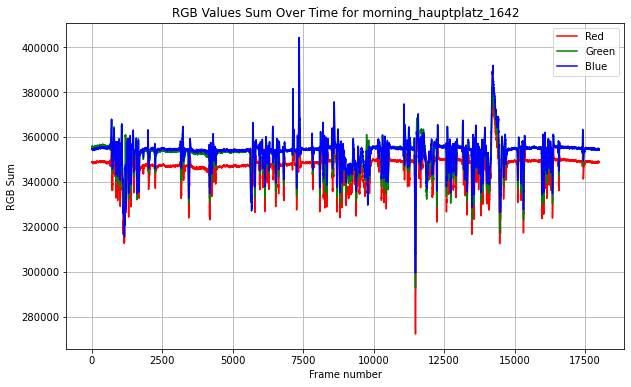

FINISHED morning_hauptplatz_1642: 1.9 [min]


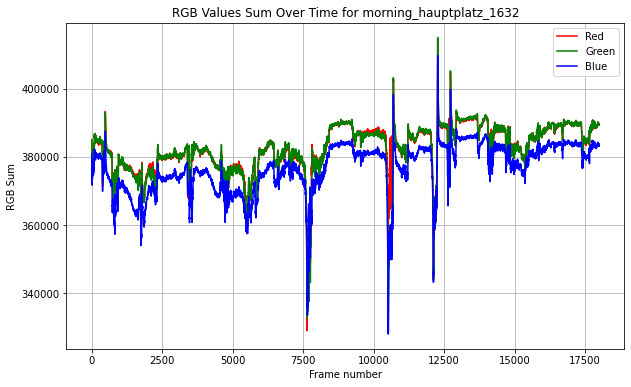

FINISHED morning_hauptplatz_1632: 1.9 [min]


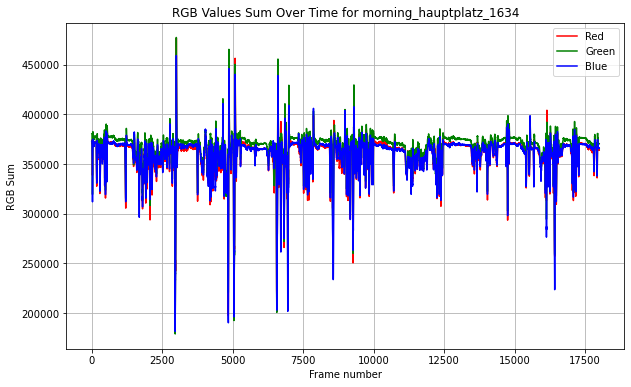

FINISHED morning_hauptplatz_1634: 4.5 [min]


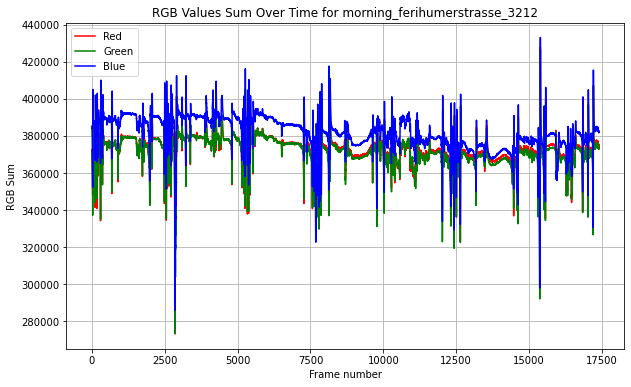

FINISHED morning_ferihumerstrasse_3212: 4.6 [min]


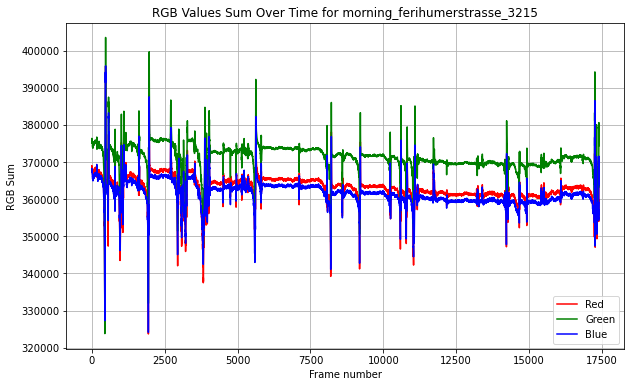

FINISHED morning_ferihumerstrasse_3215: 4.3 [min]


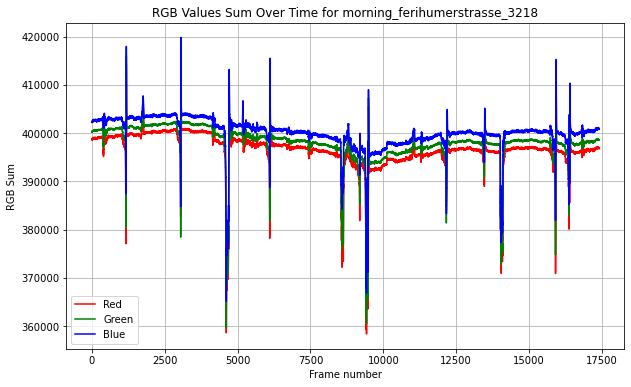

FINISHED morning_ferihumerstrasse_3218: 4.4 [min]


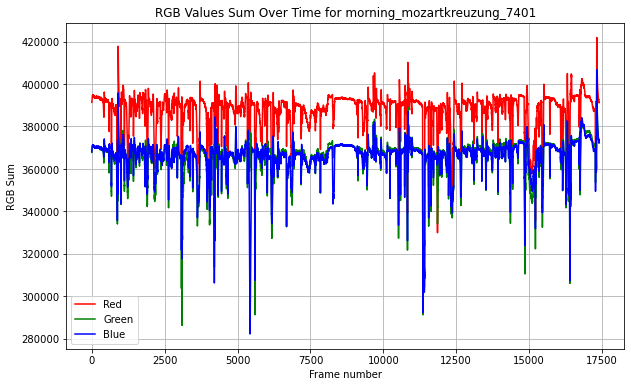

FINISHED morning_mozartkreuzung_7401: 4.3 [min]


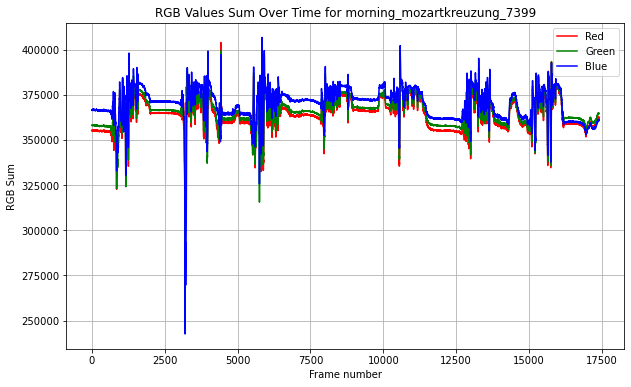

FINISHED morning_mozartkreuzung_7399: 4.5 [min]


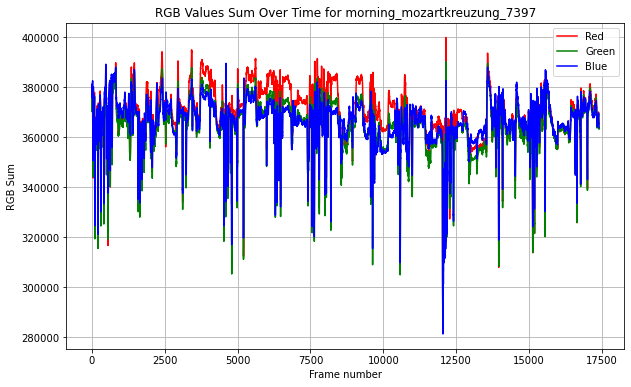

FINISHED morning_mozartkreuzung_7397: 4.3 [min]


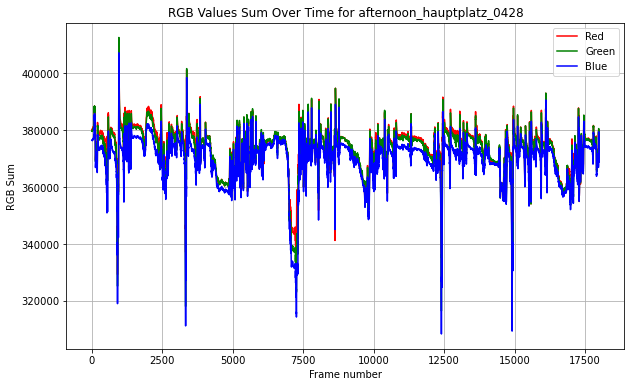

FINISHED afternoon_hauptplatz_0428: 1.8 [min]


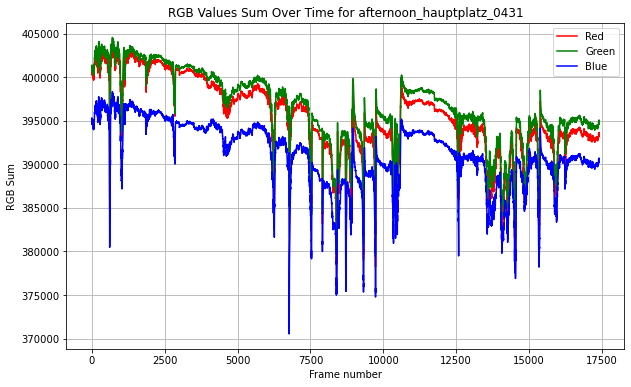

FINISHED afternoon_hauptplatz_0431: 1.7 [min]


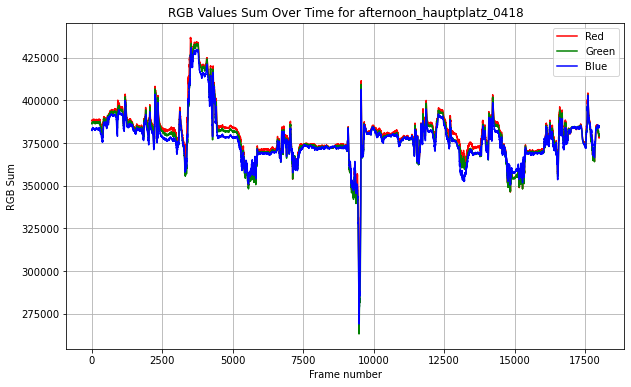

FINISHED afternoon_hauptplatz_0418: 1.8 [min]


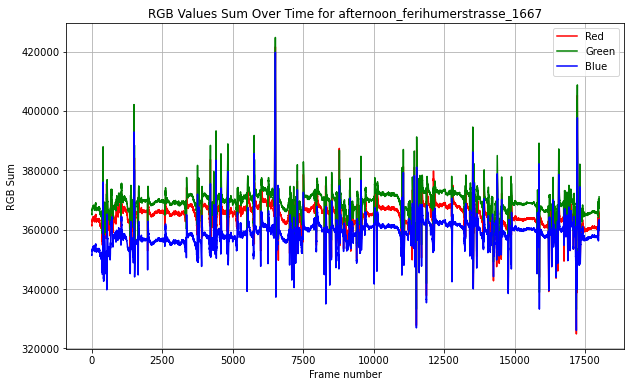

FINISHED afternoon_ferihumerstrasse_1667: 1.9 [min]


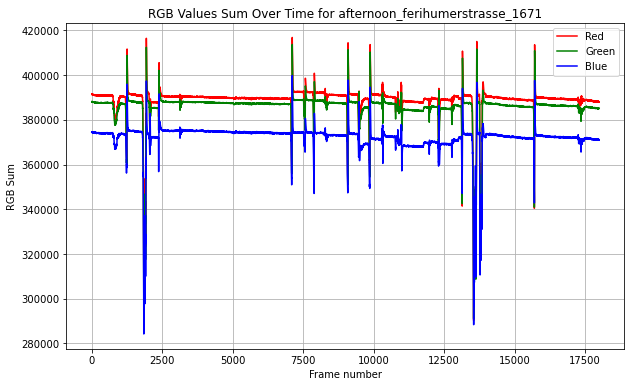

FINISHED afternoon_ferihumerstrasse_1671: 1.9 [min]


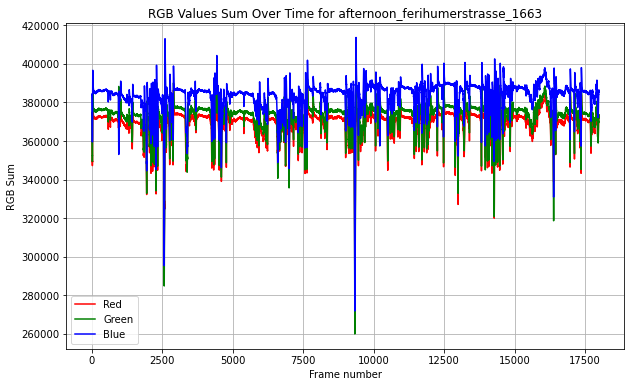

FINISHED afternoon_ferihumerstrasse_1663: 1.9 [min]


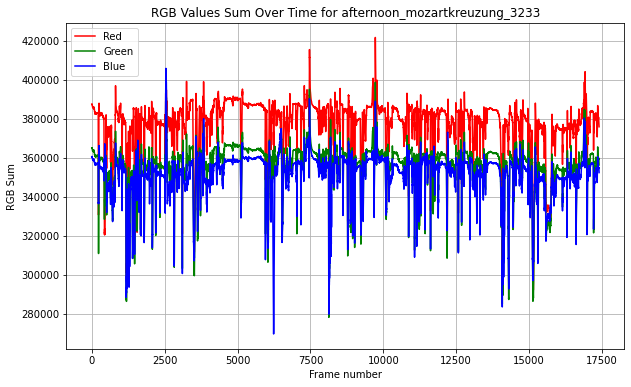

FINISHED afternoon_mozartkreuzung_3233: 1.8 [min]


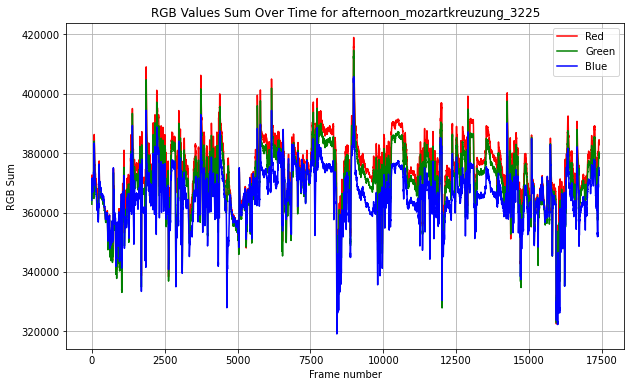

FINISHED afternoon_mozartkreuzung_3225: 1.8 [min]


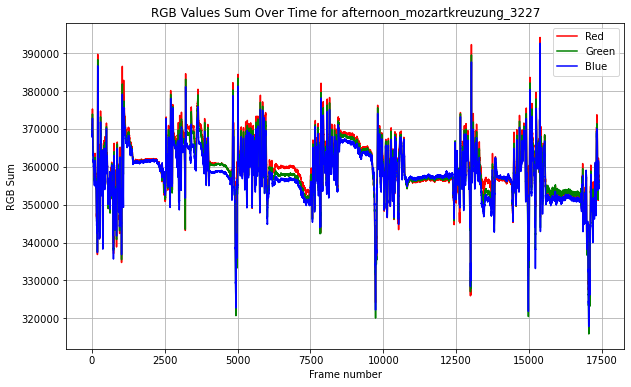

FINISHED afternoon_mozartkreuzung_3227: 1.7 [min]


In [208]:
# VIDEO PROCESSING
for video_path in filtered_videos:
    start_time = time.time()

    save_path = transform_path(video_path)
    pool_size = (20, 20)

    df = process_video(video_path, pool_size)
    save_rgb_to_pkl(df, save_path)
    plot_rgb_along_timeline(df, save_path)
    
    elapsed_time_in_minutes = (time.time() - start_time) / 60
    print(f"FINISHED {save_path}: {elapsed_time_in_minutes:.1f} [min]")

In [210]:
# RGB NORMALIZATION
paths = glob.glob('./pkl/*')

# Group the paths by morning and afternoon
morning_paths = [path for path in paths if 'morning' in path]
afternoon_paths = [path for path in paths if 'afternoon' in path]

# Process each group
process_normalization(morning_paths, 'morning')
process_normalization(afternoon_paths, 'afternoon')

In [214]:
a = pickle.load(open('./pkl/morning_hauptplatz_1642.pkl', 'rb'))
a.head()

,sum_R,sum_G,sum_B
0,348894,355648,354688
1,348871,355679,354693
2,348852,355649,354656
3,348911,355710,354766
4,348999,355800,354791


In [215]:
b = pickle.load(open('./pkl/norm/morning_hauptplatz_1642.pkl', 'rb'))
b.head()

,sum_R,sum_G,sum_B
0,186.616206,189.979722,196.990092
1,186.603904,189.996282,196.992869
2,186.593741,189.980256,196.972320
3,186.625299,190.012841,197.033413
4,186.672369,190.060917,197.047297


In [7]:
os.listdir('./pkl')

['afternoon_ferihumerstrasse_1671.pkl',
 'morning_ferihumerstrasse_3218.pkl',
 'afternoon_ferihumerstrasse_1667.pkl',
 'zcr',
 'afternoon_mozartkreuzung_3227.pkl',
 'afternoon_mozartkreuzung_3233.pkl',
 '.DS_Store',
 'afternoon_ferihumerstrasse_1663.pkl',
 'afternoon_hauptplatz_0428.pkl',
 'afternoon_mozartkreuzung_3225.pkl',
 'morning_mozartkreuzung_7399.pkl',
 'morning_mozartkreuzung_7401.pkl',
 'tuned',
 'norm',
 'morning_hauptplatz_1642.pkl',
 'morning_mozartkreuzung_7397.pkl',
 '.ipynb_checkpoints',
 'morning_ferihumerstrasse_3212.pkl',
 'morning_hauptplatz_1634.pkl',
 'afternoon_hauptplatz_0431.pkl',
 'afternoon_hauptplatz_0418.pkl',
 'morning_ferihumerstrasse_3215.pkl',
 'morning_hauptplatz_1632.pkl',
 'rms']

In [2]:
class ColorTuner:
    def __init__(self, df_rgb, df_rms):
        """
        Initialize the ColorTuner with RGB values and RMS values.
        
        df_rgb: DataFrame containing RGB values. Shape: (n_frames, 3)
        df_rms: DataFrame containing RMS values. Shape: (n_frames, 1)
        """
        self.df_rgb = df_rgb
        self.df_rms = df_rms

    def _validate_shapes(self):
        """Ensure both dataframes have the same number of rows."""
        if len(self.df_rgb) != len(self.df_rms):
            raise ValueError("Both dataframes must have the same number of rows.")

    def dynamic_brightness(self):
        """Adjust the brightness of the video frames based on RMS values."""
        self._validate_shapes()
        df_result = self.df_rgb.copy()
        brightness_factor = self.df_rms.values.flatten() / np.max(self.df_rms.values)  # Flatten ensures it's 1D
        for col in df_result.columns:
            df_result[col] *= brightness_factor
        return df_result

    def pulsating_color(self):
        """Pulsate the color intensity based on RMS values."""
        self._validate_shapes()
        df_result = self.df_rgb.copy()
        pulsation_factor = 1 + 0.5 * np.sin(2 * np.pi * self.df_rms.values.flatten())  # Using sin to pulsate
        for col in df_result.columns:
            df_result[col] *= pulsation_factor
        return df_result

    def color_shift(self):
        """Shift the dominant color based on RMS values."""
        self._validate_shapes()
        df_result = self.df_rgb.copy()
        shift_factor = self.df_rms.values.flatten() / np.max(self.df_rms.values)
        
        for col in df_result.columns:
            df_result[col] *= shift_factor
            
        return df_result

    def color_contrast(self):
        """Increase the contrast based on RMS values."""
        self._validate_shapes()
        df_result = self.df_rgb.copy()
        contrast_factor = self.df_rms.values.flatten() / (1 + np.exp(-self.df_rms.values.flatten()))  # Using a sigmoid function
        for col in df_result.columns:
            df_result[col] = 128 + contrast_factor * (df_result[col] - 128)  # Adjusting contrast
        return df_result

In [3]:
def make_square_video(df, save_video_name, fps, color_space="rgb"):
    # Validate color space
    if color_space not in ["rgb", "hsv"]:
        raise ValueError("Unsupported color space. Choose 'rgb' or 'hsv'.")

    # Create a video writer object using H.264 codec
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    
    # Specify the name for the output video file with .mp4 extension
    output_video_name = f"./result/{save_video_name}.mp4"
    out = cv2.VideoWriter(output_video_name, fourcc, fps, (720, 720))
    
    # For each row in the DataFrame, generate a colored square and write it to the video
    for _, row in df.iterrows():
        frame = np.zeros((720, 720, 3), dtype=np.uint8)

        if color_space == "rgb":
            color = (int(row['sum_B']), int(row['sum_G']), int(row['sum_R']))  # OpenCV uses BGR order
            frame[:] = color

        elif color_space == "hsv":
            hsv_color = (int(row['H']), int(row['S']), int(row['V']))
            frame[:, :] = hsv_color
            frame = cv2.cvtColor(frame, cv2.COLOR_HSV2BGR)

        out.write(frame)
    
    out.release()

In [220]:
def normalize_to_255(column):
    """
    Normalize a pandas series to the range [0, 255]

    Parameters:
    - column: pandas Series

    Returns:
    - Normalized pandas Series
    """
    min_val = column.min()
    max_val = column.max()
    normalized = ((column - min_val) / (max_val - min_val)) * 255
    return normalized.astype(np.uint8)  # Convert to byte range

In [249]:
norm_rgb_pkl_list = glob.glob('./pkl/norm/*')


,sum_R,sum_G,sum_B
0,228.507570,228.338175,221.673739
1,228.581715,228.397020,221.682617
2,228.478963,228.305223,221.577851
3,228.517495,228.341118,221.629938
4,228.505819,228.327584,221.625203


In [257]:
rgb_path = glob.glob('./pkl/norm/*')[0]
rgb_path

'./pkl/norm/afternoon_ferihumerstrasse_1671.pkl'

In [262]:
rgb = pickle.load(open(rgb_path, 'rb'))
rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))
zcr = pickle.load(open(rgb_path.replace('norm', 'zcr'), 'rb'))

In [263]:
rgb.head()

,sum_R,sum_G,sum_B
0,228.507570,228.338175,221.673739
1,228.581715,228.397020,221.682617
2,228.478963,228.305223,221.577851
3,228.517495,228.341118,221.629938
4,228.505819,228.327584,221.625203


In [264]:
rms.head()

,RMS
0,0.017138
1,0.017932
2,0.013054
3,0.008889
4,0.008225


In [265]:
rms_tuned = combine_dataframes(rgb, rms, method="geometric")
zcr_tuned = combine_dataframes(rgb, zcr, method="geometric")
nrm_rms, nrm_zcr = normalize_to_255(rms_tuned), normalize_to_255(zcr_tuned)

In [278]:
# df_rgb = pd.DataFrame(np.random.randint(0, 256, (18000, 3)), columns=['R', 'G', 'B'])
# df_rms = pd.DataFrame(np.random.random(18000))
df_rgb = pickle.load(open(rgb_path, 'rb'))
df_rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))
df_zcr = pickle.load(open(rgb_path.replace('norm', 'zcr'), 'rb'))

In [281]:
df_rgb.shape, df_rms.shape

((18000, 3), (18000, 1))

In [301]:
tuner = ColorTuner(df_rgb, df_rms)
brightened_frames = tuner.dynamic_brightness()
pulsating_frames = tuner.pulsating_color()
shifted_frames = tuner.color_shift()
contrasted_frames = tuner.color_contrast()

In [310]:
def process_and_save(df_rgb, df_audio_feature, feature_name, color_space, fps, name_prefix):
    tuner = ColorTuner(df_rgb, df_audio_feature)
    # Possible tuning methods
    tuning_methods = {
        'dynamic_brightness': tuner.dynamic_brightness,
        'pulsating_color': tuner.pulsating_color,
        'color_shift': tuner.color_shift,
        'color_contrast': tuner.color_contrast
    }

    # Base video
    start_time = time.time()
    make_square_video(df_rgb, f"{name_prefix}_{color_space}", fps*6, color_space)
    elapsed_time = time.time() - start_time
    print(f"Time taken for base video: {elapsed_time:.2f} seconds")

    # Tuned by feature using geometric mean
    start_time = time.time()
    tuned_geo = tuner.geometric_amplification()
    make_square_video(tuned_geo, f"{name_prefix}_{feature_name}_{color_space}_geo", fps*6, color_space)
    elapsed_time = time.time() - start_time
    print(f"Time taken for geometric amplification: {elapsed_time:.2f} seconds")

    # Tuned by other methods
    for method_name, method_func in tuning_methods.items():
        start_time = time.time()
        tuned_frames = method_func()
        make_square_video(tuned_frames, f"{name_prefix}_{color_space}_{feature_name}_{method_name}", fps*6, color_space)
        elapsed_time = time.time() - start_time
        print(f"Time taken for {method_name}: {elapsed_time:.2f} seconds")

In [333]:
a = pickle.load(open('./pkl/norm/morning_ferihumerstrasse_3218.pkl', 'rb'))
a.shape

(17400, 3)

In [334]:
rgb = pickle.load(open(rgb_path, 'rb'))
rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))
zcr = pickle.load(open(rgb_path.replace('norm', 'zcr'), 'rb'))

In [336]:
type(rms)

pandas.core.frame.DataFrame

In [337]:
def resample_dataframe(df, desired_rows):
    if not isinstance(df, pd.DataFrame):
        raise ValueError("Input should be a pandas DataFrame.")

    if df.shape[1] != 1:
        raise ValueError("DataFrame should have only one column.")

    # Create an interpolation function
    interp = np.interp(
        x=np.linspace(0, len(df) - 1, desired_rows),  # new index positions
        xp=np.arange(len(df)),                        # old index positions
        fp=df.iloc[:, 0].values                       # old values from the first (and only) column
    )

    # Convert back to a DataFrame
    df_resampled = pd.DataFrame(interp, columns=df.columns)

    return df_resampled

In [ ]:
norm_rgb_pkl_list = [i for i in glob.glob('./pkl/norm/*') if 'norm' not in i.split('/')[-1]]

## Run

In [338]:
# FINAL VERSION

for rgb_path in norm_rgb_pkl_list[1:]:
    # Load pkl files
    rgb = pickle.load(open(rgb_path, 'rb'))
    rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))
    
    name = rgb_path.split('/')[-1].replace('.pkl', '')
    fps = 29 if rgb.shape[0] % 29 == 0 else 30
    if fps == 29:
        rms = resample_dataframe(rms, 17400)

    # color space
    c = "rgb"
    
    audio_features = {
        'rms': rms, 
    }

    start_time = time.time()
    
    make_square_video(rgb, f"{name}_{c}", fps*6, c)
    
    for feature_name, feature_data in audio_features.items():
        # Base video
        tuner = ColorTuner(rgb, feature_data)
    
        # Other tuning methods
        tuning_methods = {
            'dynamic_brightness': tuner.dynamic_brightness,
            'pulsating_color': tuner.pulsating_color,
            'color_shift': tuner.color_shift,
        }
    
        for method_name, method_func in tuning_methods.items():
            tuned_frames = method_func()
            make_square_video(tuned_frames, f"{name}_{c}_{feature_name}_{method_name}", fps*6, c)
        
    elapsed_time_in_minutes = (time.time() - start_time) / 60
    print(f"FINISHED {rgb_path}: {elapsed_time_in_minutes:.1f} [min]")

FINISHED ./pkl/norm/morning_ferihumerstrasse_3218.pkl: 5.6 [min]
FINISHED ./pkl/norm/afternoon_ferihumerstrasse_1667.pkl: 6.2 [min]
FINISHED ./pkl/norm/afternoon_mozartkreuzung_3227.pkl: 6.0 [min]
FINISHED ./pkl/norm/afternoon_mozartkreuzung_3233.pkl: 5.8 [min]
FINISHED ./pkl/norm/afternoon_ferihumerstrasse_1663.pkl: 5.9 [min]
FINISHED ./pkl/norm/afternoon_hauptplatz_0428.pkl: 5.6 [min]
FINISHED ./pkl/norm/afternoon_mozartkreuzung_3225.pkl: 5.6 [min]
FINISHED ./pkl/norm/morning_mozartkreuzung_7399.pkl: 5.5 [min]
FINISHED ./pkl/norm/morning_mozartkreuzung_7401.pkl: 5.5 [min]
FINISHED ./pkl/norm/morning_hauptplatz_1642.pkl: 5.8 [min]
FINISHED ./pkl/norm/morning_mozartkreuzung_7397.pkl: 5.5 [min]
FINISHED ./pkl/norm/morning_ferihumerstrasse_3212.pkl: 5.3 [min]
FINISHED ./pkl/norm/morning_hauptplatz_1634.pkl: 6.1 [min]
FINISHED ./pkl/norm/afternoon_hauptplatz_0431.pkl: 5.4 [min]
FINISHED ./pkl/norm/afternoon_hauptplatz_0418.pkl: 5.8 [min]
FINISHED ./pkl/norm/morning_ferihumerstrasse_3215.p

### unused codes

In [ ]:
norm_rgb_pkl_list = glob.glob('./pkl/norm/*')

for rgb_path in norm_rgb_pkl_list:
    # Load pkl files
    rgb = pickle.load(open(rgb_path, 'rb'))
    rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))
    zcr = pickle.load(open(rgb_path.replace('norm', 'zcr'), 'rb'))
    
    name = rgb_path.split('/')[-1].replace('.pkl', '')
    fps = 29 if rgb.shape[0] % 29 == 0 else 30

    # color space
    c = "rgb"
    
    audio_features = {
        'rms': rms, 
        'zcr': zcr 
    }
    
    for feature_name, feature_data in audio_features.items():
        # Base video
        make_square_video(rgb, f"{name}_{c}", fps*6, c)
        tuner = ColorTuner(rgb, feature_data)
        
        # Geometric amplification
        tuned_geo = combine_dataframes(rgb, feature_data, method="geometric")
        make_square_video(tuned_geo, f"{name}_{feature_name}_{c}_geo", fps*6, c)
    
        # Other tuning methods
        tuning_methods = {
            'dynamic_brightness': tuner.dynamic_brightness,
            'pulsating_color': tuner.pulsating_color,
            'color_shift': tuner.color_shift,
            'color_contrast': tuner.color_contrast
        }
    
        for method_name, method_func in tuning_methods.items():
            tuned_frames = method_func()
            make_square_video(tuned_frames, f"{name}_{c}_{feature_name}_{method_name}", fps*6, c)

In [309]:
norm_rgb_pkl_list = glob.glob('./pkl/norm/*')

for rgb_path in norm_rgb_pkl_list:
    # LOAD
    rgb = pickle.load(open(rgb_path, 'rb'))
    rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))
    zcr = pickle.load(open(rgb_path.replace('norm', 'zcr'), 'rb'))
    
    rms_tuned = combine_dataframes(rgb, rms, method="geometric")
    zcr_tuned = combine_dataframes(rgb, zcr, method="geometric")
    nrm_rms, nrm_zcr = normalize_to_255(rms_tuned), normalize_to_255(zcr_tuned)
    
    name = rgb_path.split('/')[-1].replace('.pkl', '')
    fps = 29 if rgb.shape[0] % 29 == 0 else 30

    for c in ["rgb", "hsv"]:
        start_time = time.time()

        if c == "rgb":
            make_square_video(rgb, name+f'_{c}', fps*6, c)
            make_square_video(rms_tuned, name+f'_rms_{c}_geo', fps*6, c)
            # make_square_video(zcr_tuned, name+f'_zcr_{c}_geo', fps*6, c)

            tuner = ColorTuner(rgb, rms)
            brightened_frames = tuner.dynamic_brightness()
            pulsating_frames = tuner.pulsating_color()
            shifted_frames = tuner.color_shift()
            contrasted_frames = tuner.color_contrast()

            make_square_video(brightened_frames, name+f'_{c}_rms_dyn', fps*6, c)
            # make_square_video(pulsating_frames, name+f'_{c}_rms_pul', fps*6, c)
            # make_square_video(shifted_frames, name+'_{c}_rms_shi', fps*6, c)
            # make_square_video(contrasted_frames, name+'_{c}_rms_con', fps*6, c)
            break
                              
        else:
            rgb_array = rgb.to_numpy()
            rgb_array = rgb_array.reshape(-1, 1, 3)
            hsv_array = cv2.cvtColor(np.uint8(rgb_array), cv2.COLOR_RGB2HSV)
            hsv_array = hsv_array.reshape(-1, 3)
            hsv = pd.DataFrame(hsv_array, columns=['H', 'S', 'V'])
            
            rms_tuned = combine_dataframes(hsv, rms, method="geometric")
            zcr_tuned = combine_dataframes(hsv, zcr, method="geometric")
            nrm_rms, nrm_zcr = normalize_to_255(rms_tuned), normalize_to_255(zcr_tuned)

            make_square_video(hsv, name+f'_{c}', fps*6, c)
            make_square_video(rms_tuned, name+f'_{c}_rms', fps*6, c)
            make_square_video(zcr_tuned, name+f'_{c}_zcr', fps*6, c)          
        
        elapsed_time_in_minutes = (time.time() - start_time) / 60
        print(f"FINISHED {rgb_path}: {elapsed_time_in_minutes:.1f} [min]")

ValueError: Both dataframes must have the same number of rows.

# Plotting

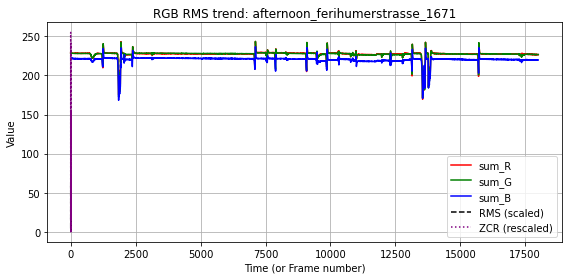

In [346]:
rgb_path = norm_rgb_pkl_list[0]
# Load pkl files
rgb = pickle.load(open(rgb_path, 'rb'))
rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))
zcr = pickle.load(open(rgb_path.replace('norm', 'zcr'), 'rb'))

if rgb.shape[0] != rms.shape[0]:
    rms = resample_dataframe(rms, rgb.shape[0])
    zcr = resample_dataframe(zcr, zcr.shape[0])
    fps = 29
else:
    fps = 30

# Define the filename transformation for saving
base_name = os.path.splitext(os.path.basename(rgb_path))[0]
new_filename = f"./viz/{base_name}.png"

# Plotting
plt.figure(figsize=(8, 4))

# RGB colors for plotting RGB channels
colors = {'sum_R': 'red', 'sum_G': 'green', 'sum_B': 'blue'}

# Plot RGB channels
for col, color in colors.items():
    plt.plot(rgb[col], label=col, color=color)

# Plot RMS values
times_in_minutes = np.arange(len(rgb)) / fps / 60
plt.plot(times_in_minutes, rms * 255, label='RMS (scaled)', linestyle='--', color='black')  # scaled to 0-255 range for visualization
zcr_rescaled = (zcr - zcr.min()) / (zcr.max() - zcr.min()) * 255
plt.plot(times_in_minutes, zcr_rescaled, label='ZCR (rescaled)', linestyle=':', color='purple')  # using purple for ZCR

plt.title(f"RGB RMS trend: {base_name}")
plt.xlabel("Time (or Frame number)")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
# plt.savefig(new_filename, dpi=100)
plt.show()


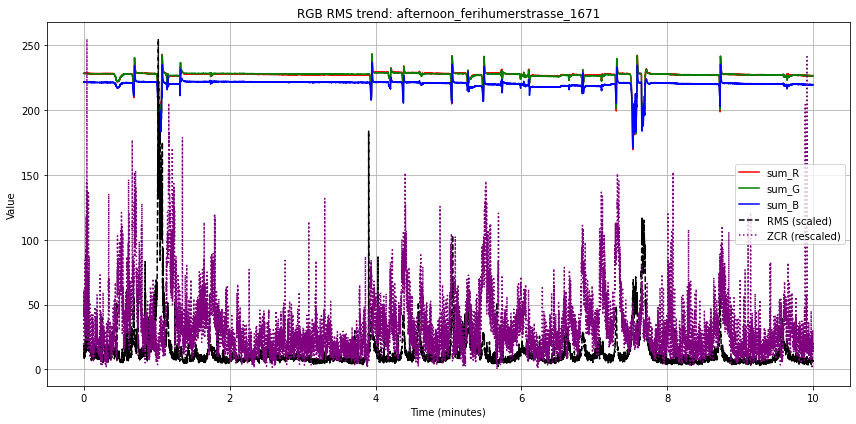

In [348]:
# Assuming you have loaded your data already...

# Define the filename transformation for saving
base_name = os.path.splitext(os.path.basename(rgb_path))[0]
new_filename = f"./viz/{base_name}.png"


# Create time vector for x-axis
times_in_minutes = np.arange(len(rgb)) / fps / 60

# Rescale RMS and ZCR values to the range [0, 255]
rms_rescaled = rms.values / np.max(rms.values) * 255
zcr_rescaled = (zcr - zcr.min()) / (zcr.max() - zcr.min()) * 255

# Plotting
plt.figure(figsize=(12, 6))

# RGB colors for plotting RGB channels
colors = {'sum_R': 'red', 'sum_G': 'green', 'sum_B': 'blue'}

# Plot RGB channels
for col, color in colors.items():
    plt.plot(times_in_minutes, rgb[col], label=col, color=color)

# Plot RMS and ZCR values
plt.plot(times_in_minutes, rms_rescaled, label='RMS (scaled)', linestyle='--', color='black') 
plt.plot(times_in_minutes, zcr_rescaled, label='ZCR (rescaled)', linestyle=':', color='purple')

plt.title(f"RGB RMS trend: {base_name}")
plt.xlabel("Time (minutes)")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig(new_filename, dpi=100)
plt.show()


(18000, 3) (18000, 1)


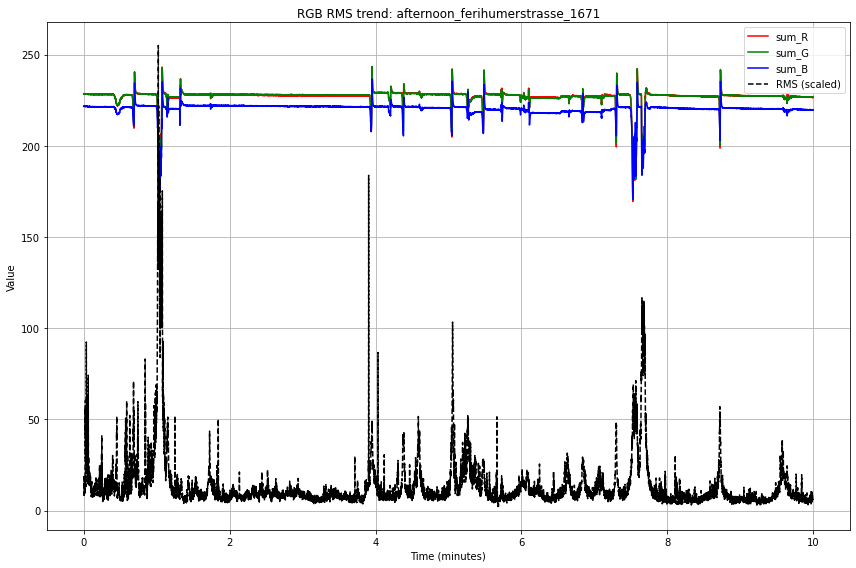

(17400, 3) (17400, 1)


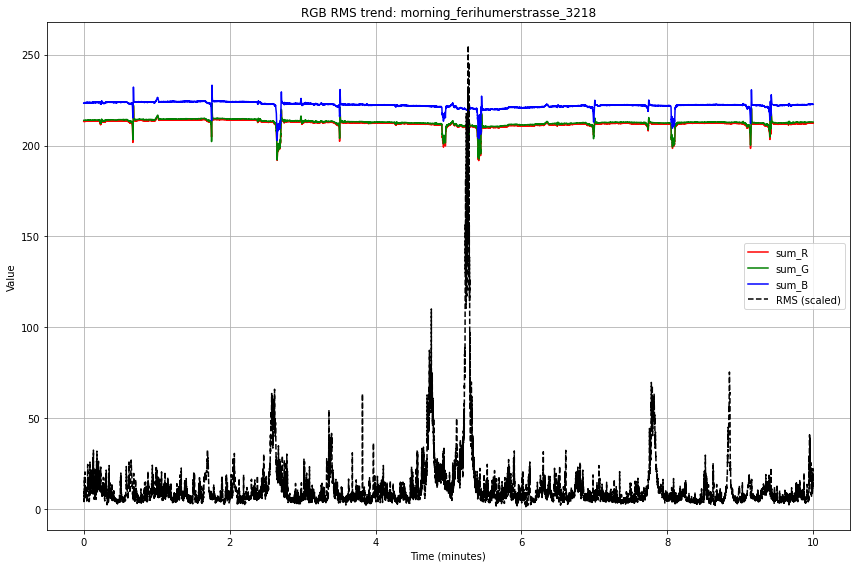

(18000, 3) (18000, 1)


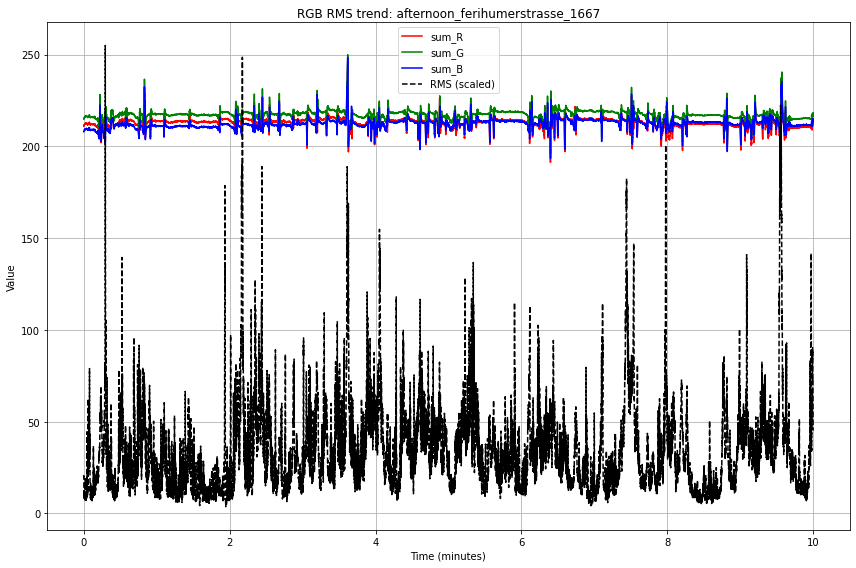

(17400, 3) (17400, 1)


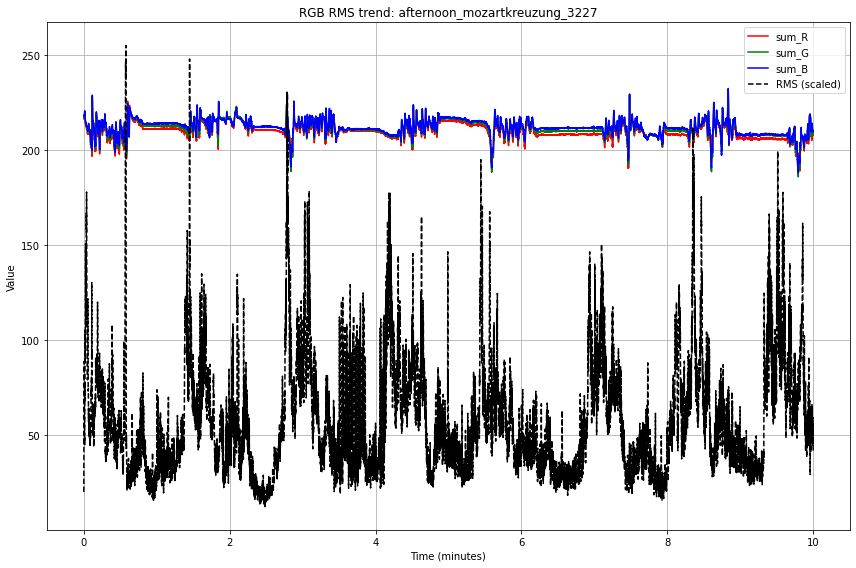

(17400, 3) (17400, 1)


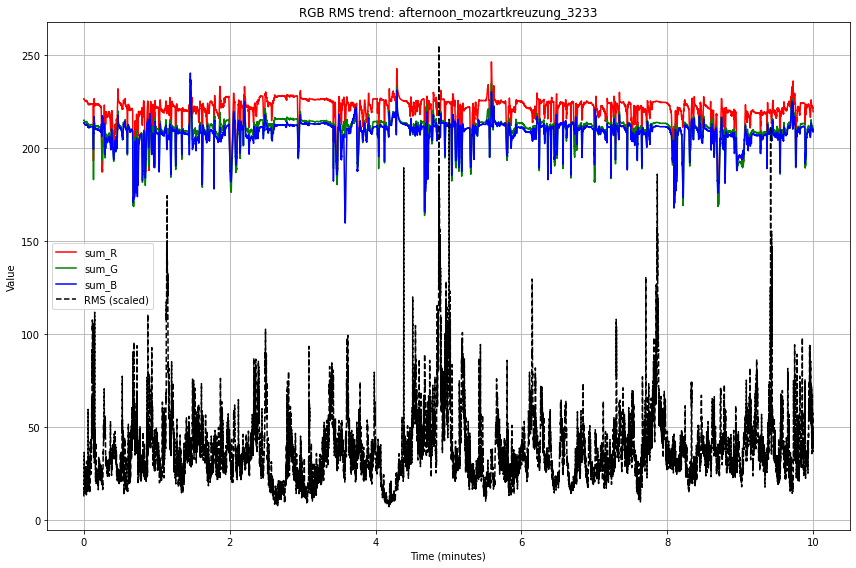

(18000, 3) (18000, 1)


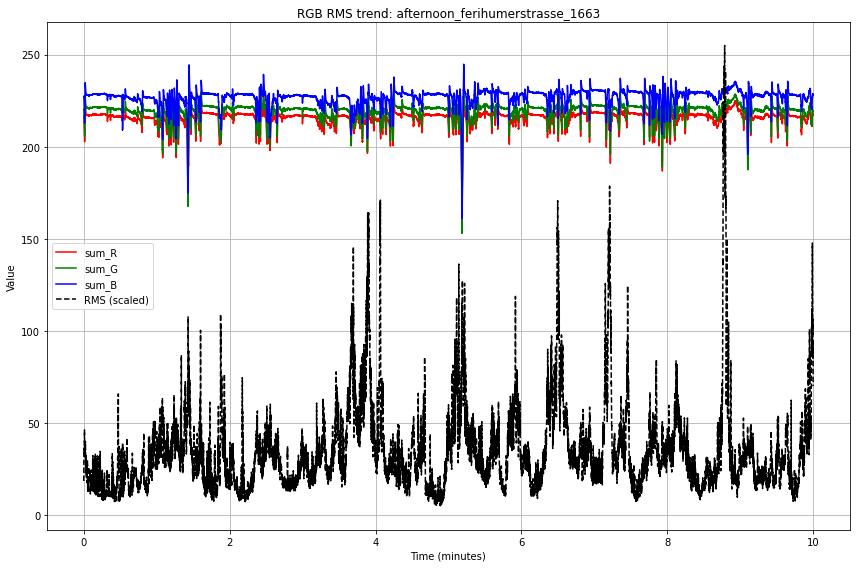

(18000, 3) (18000, 1)


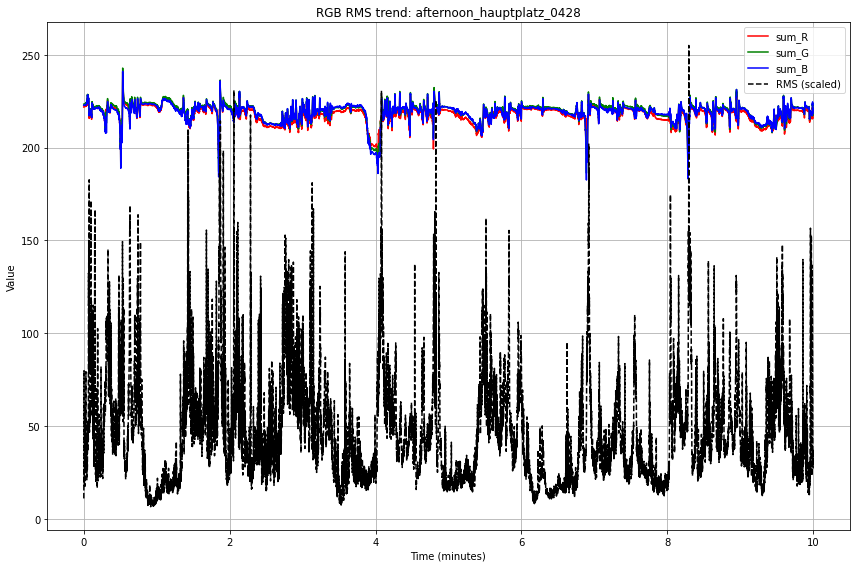

(17400, 3) (17400, 1)


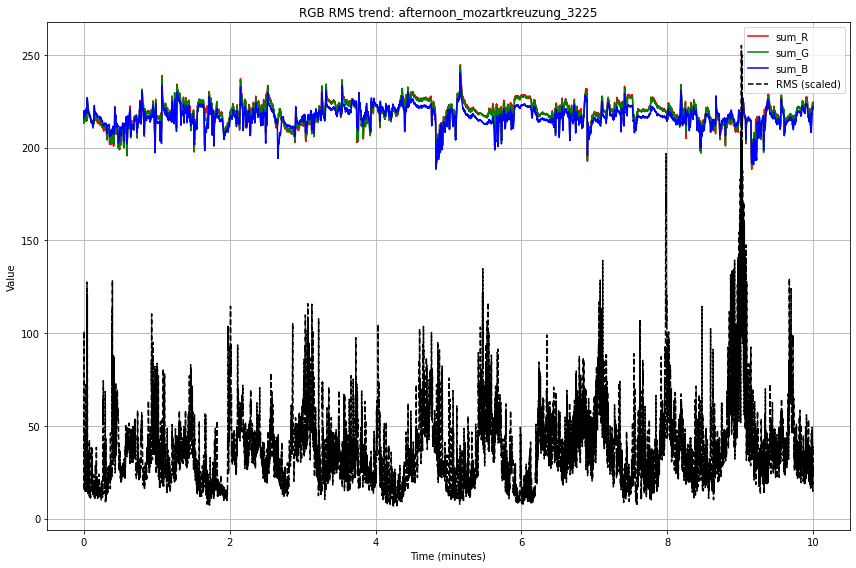

(17400, 3) (17400, 1)


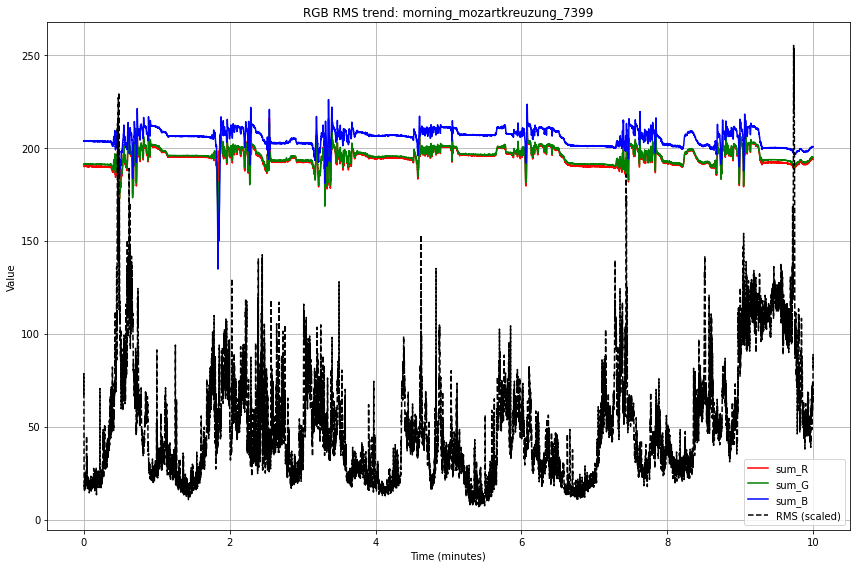

(17400, 3) (17400, 1)


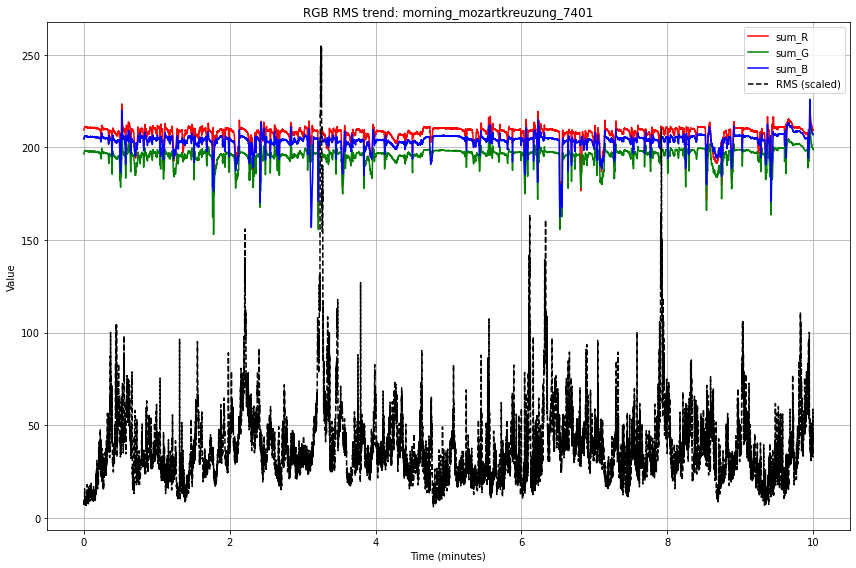

(18000, 3) (18000, 1)


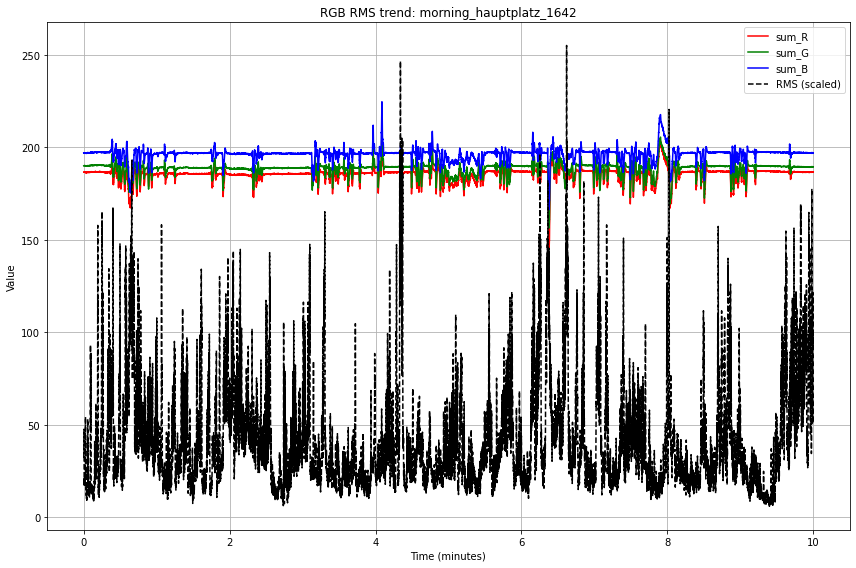

(17400, 3) (17400, 1)


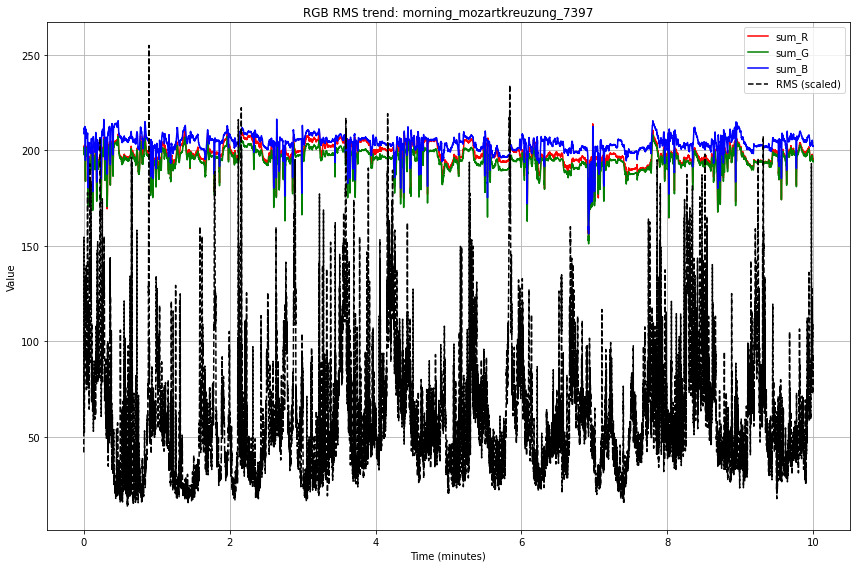

(17400, 3) (17400, 1)


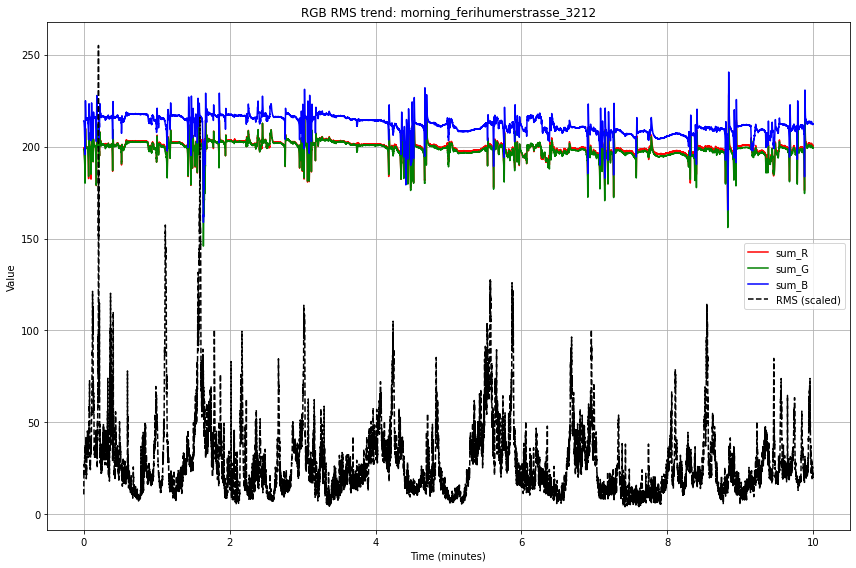

(18000, 3) (18000, 1)


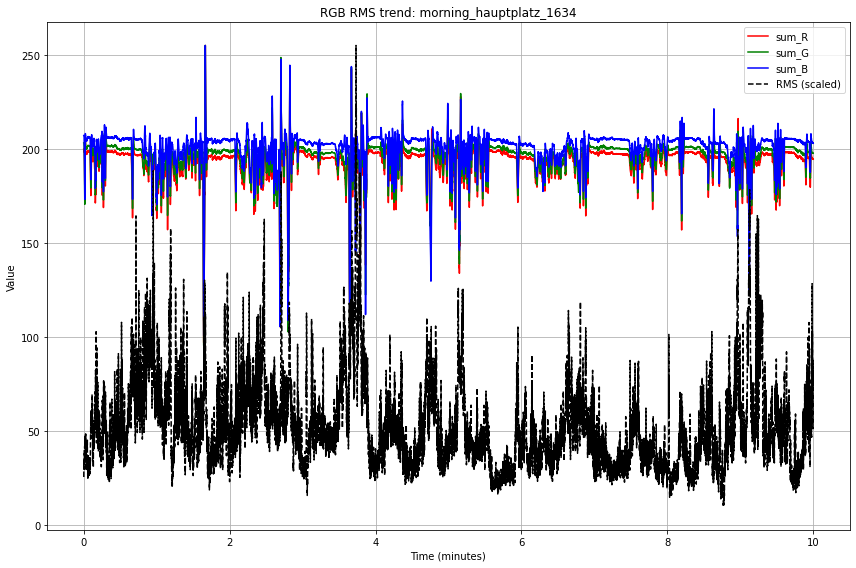

(17400, 3) (17400, 1)


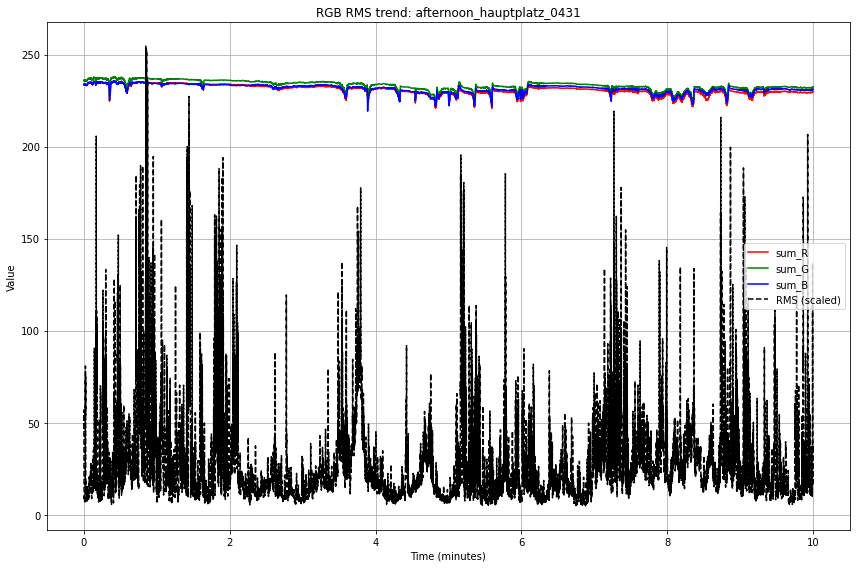

(18000, 3) (18000, 1)


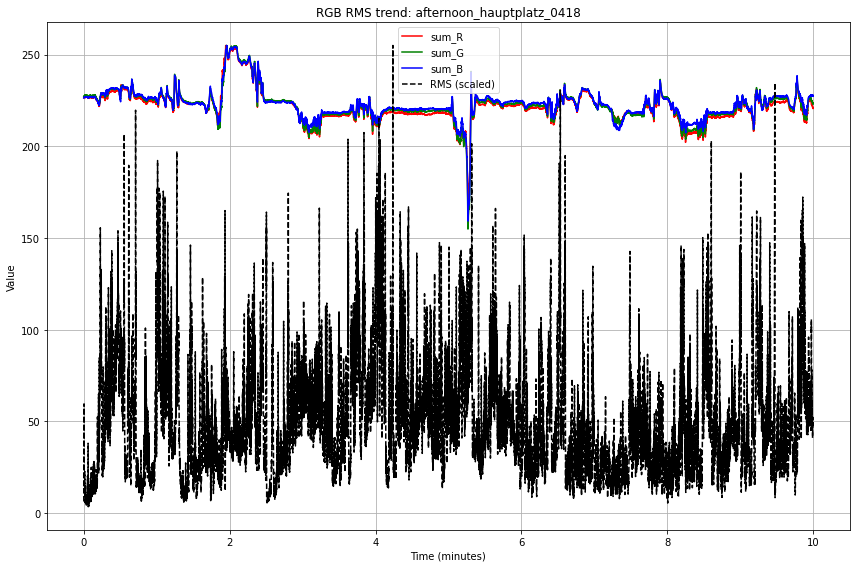

(17400, 3) (17400, 1)


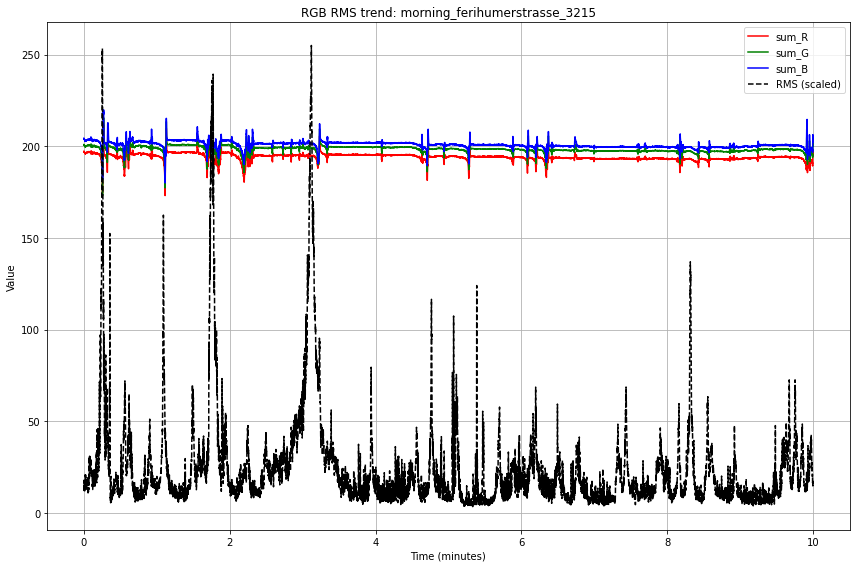

(18000, 3) (18000, 1)


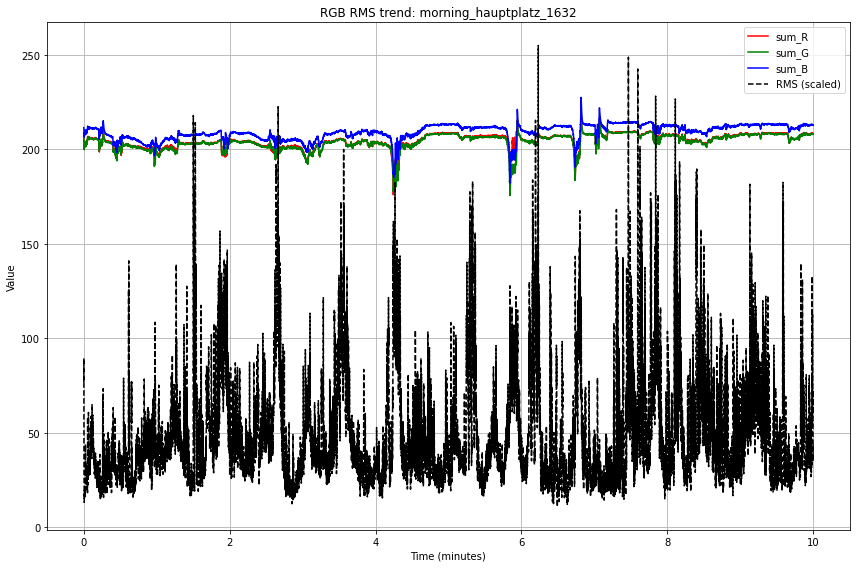

In [356]:
norm_rgb_pkl_list = [i for i in glob.glob('./pkl/norm/*') if 'norm' not in i.split('/')[-1]]


for rgb_path in norm_rgb_pkl_list:
    # Load pkl files
    rgb = pickle.load(open(rgb_path, 'rb'))
    rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))
    zcr = pickle.load(open(rgb_path.replace('norm', 'zcr'), 'rb'))

    if rgb.shape[0] % 29 == 0:
        rms = resample_dataframe(rms, rgb.shape[0])
        zcr = resample_dataframe(zcr, rgb.shape[0])
        fps = 29
    else:
        fps = 30
        
    print(rgb.shape, rms.shape)
    base_name = os.path.splitext(os.path.basename(rgb_path))[0]
    new_filename = f"./viz/rms_{base_name}.png"
    
    # Create time vector for x-axis
    times_in_minutes = np.arange(len(rgb)) / fps / 60
    
    # Rescale RMS and ZCR values to the range [0, 255]
    rms_rescaled = rms.values / np.max(rms.values) * 255
    zcr_rescaled = (zcr - zcr.min()) / (zcr.max() - zcr.min()) * 255
    
    # Plotting
    plt.figure(figsize=(12, 8))
    
    # RGB colors for plotting RGB channels
    colors = {'sum_R': 'red', 'sum_G': 'green', 'sum_B': 'blue'}
    
    # Plot RGB channels
    for col, color in colors.items():
        plt.plot(times_in_minutes, rgb[col], label=col, color=color)
    
    # Plot RMS and ZCR values
    plt.plot(times_in_minutes, rms_rescaled, label='RMS (scaled)', linestyle='--', color='black') 
    # plt.plot(times_in_minutes, zcr_rescaled, label='ZCR (rescaled)', linestyle=':', color='orange')
    
    plt.title(f"RGB RMS trend: {base_name}")
    plt.xlabel("Time (minutes)")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(new_filename, dpi=100)
    plt.show()

In [368]:
tuning_results['color_shift']

,sum_R,sum_G,sum_B,mean_value
0,62.098703,62.040117,63.794291,62.644370
1,72.168033,72.107473,74.148456,72.807987
2,45.341799,45.297884,46.619327,45.753003
3,35.987215,35.936531,37.030471,36.318072
4,24.616377,24.584083,25.363103,24.854521
...,...,...,...,...
17995,38.392289,38.346748,39.238592,38.659210
17996,34.115513,34.079859,34.871808,34.355727
17997,30.901334,30.868565,31.585806,31.118568
17998,28.713007,28.681529,29.348833,28.914456


In [366]:
tuning_results['pulsating_color']

,sum_R,sum_G,sum_B,mean_value
0,241.696199,241.468175,248.295649,243.820008
1,246.978631,246.771376,253.756174,249.168727
2,231.789082,231.564584,238.319858,233.891175
3,225.838370,225.520303,232.385340,227.914671
4,218.405228,218.118706,225.030443,220.518126
...,...,...,...,...
17995,230.796476,230.522704,235.884053,232.401078
17996,228.259087,228.020531,233.319284,229.866301
17997,226.332605,226.092598,231.345929,227.923711
17998,225.018650,224.771965,230.001510,226.597375


In [364]:
tuning_results['dynamic_brightness']

,sum_R,sum_G,sum_B,mean_value
0,62.098703,62.040117,63.794291,62.644370
1,72.168033,72.107473,74.148456,72.807987
2,45.341799,45.297884,46.619327,45.753003
3,35.987215,35.936531,37.030471,36.318072
4,24.616377,24.584083,25.363103,24.854521
...,...,...,...,...
17995,38.392289,38.346748,39.238592,38.659210
17996,34.115513,34.079859,34.871808,34.355727
17997,30.901334,30.868565,31.585806,31.118568
17998,28.713007,28.681529,29.348833,28.914456


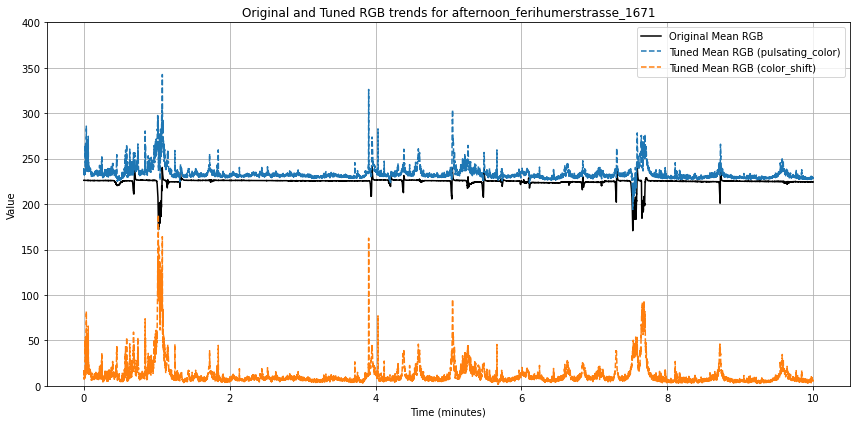

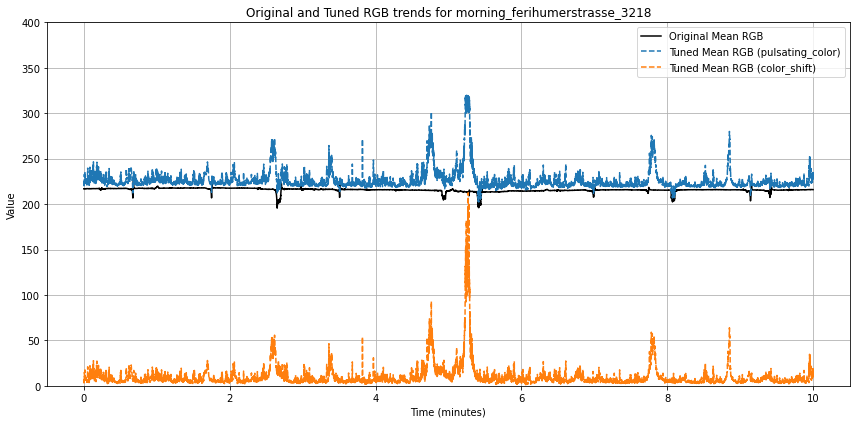

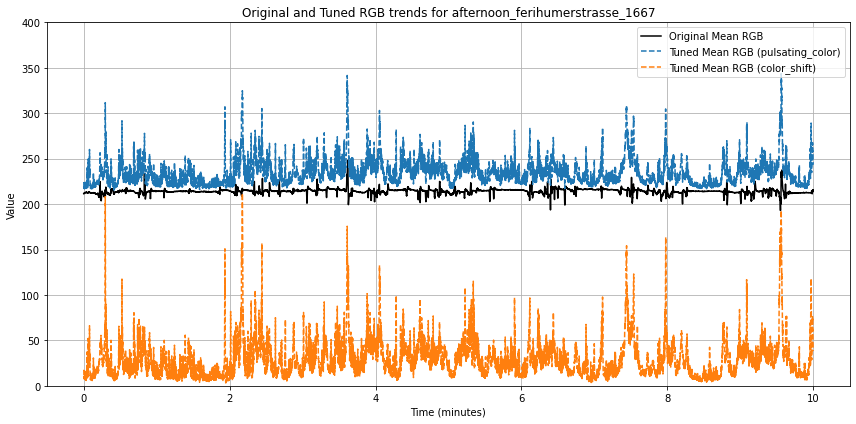

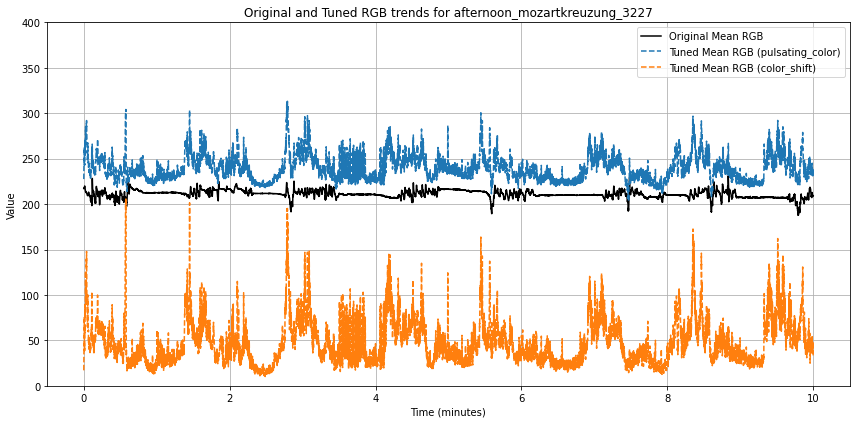

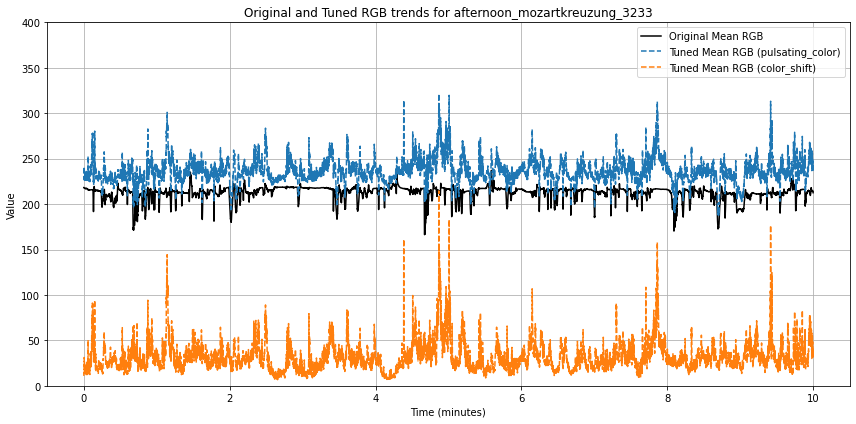

...

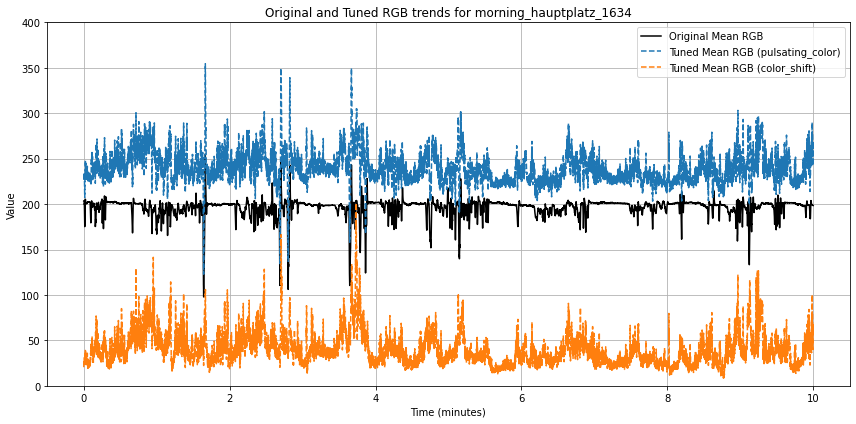

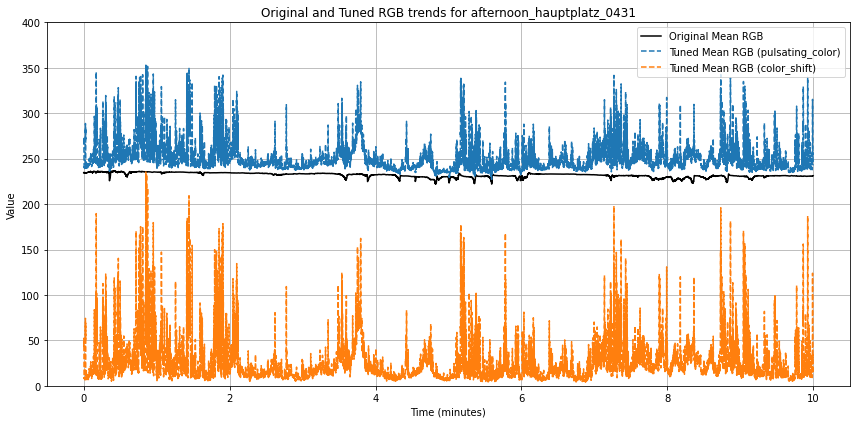

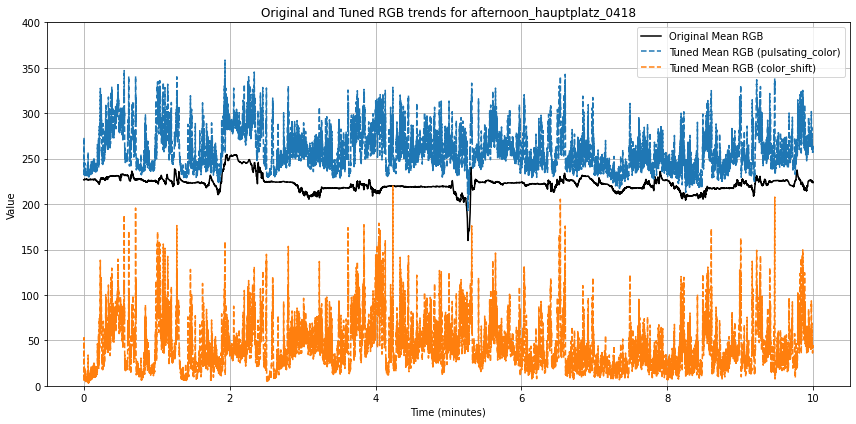

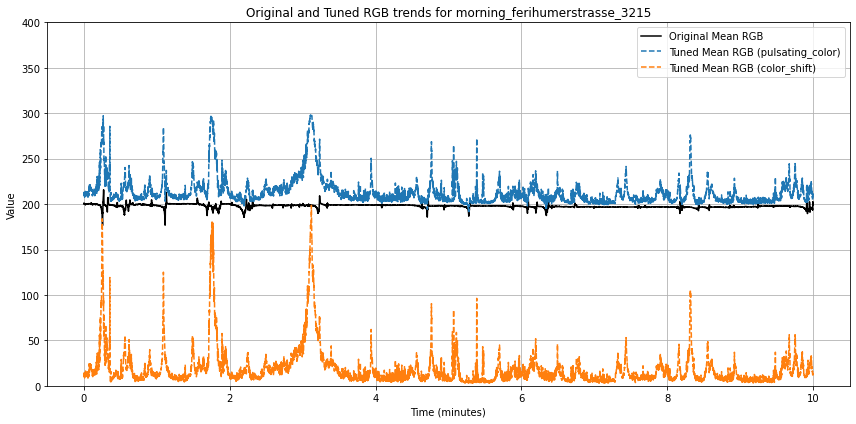

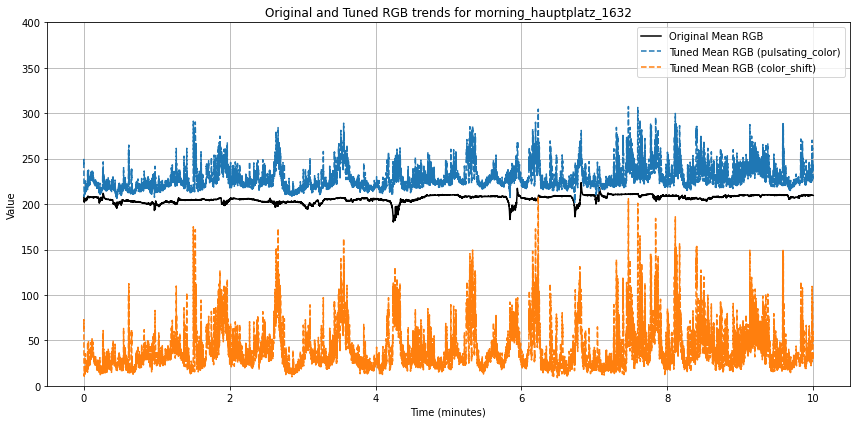

In [371]:
def plot_combined_rgb(df_original, tuning_results, fps, base_name):
    # Calculate the average mean value for each RGB frame for original data
    df_original['mean_value'] = df_original.mean(axis=1)
    
    # Set up the time axis for plotting in minutes
    times_in_minutes = np.arange(len(df_original)) / fps / 60
    
    # Plotting
    plt.figure(figsize=(12, 6))
    
    # Plot average RGB mean values for original frames
    plt.plot(times_in_minutes, df_original['mean_value'], label='Original Mean RGB', color='black')
    
    # Plot average RGB mean values for each tuning method
    for method_name, df_tuned in tuning_results.items():
        df_tuned['mean_value'] = df_tuned.mean(axis=1)
        plt.plot(times_in_minutes, df_tuned['mean_value'], label=f'Tuned Mean RGB ({method_name})', linestyle='--')
    
    plt.title(f"Original and Tuned RGB trends for {base_name}")
    plt.xlabel("Time (minutes)")
    plt.ylim(0, 400)
    plt.ylabel("Value")
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.tight_layout()
    
    # Form the filename for saving using the base name from the pkl file
    filename = f"./viz/combined_{base_name}.png"
    plt.savefig(filename, dpi=100)
    plt.show()

# Assuming the RGB files are in the norm directory and not containing 'norm' in their names
norm_rgb_pkl_list = [i for i in glob.glob('./pkl/norm/*') if 'norm' not in i.split('/')[-1]]

for rgb_path in norm_rgb_pkl_list:
    # Load the RGB pkl file
    rgb = pickle.load(open(rgb_path, 'rb'))
    rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))

    if rgb.shape[0] % 29 == 0:
        fps = 29
        rms = resample_dataframe(rms, rgb.shape[0])
    else:
        fps = 30

    # Extract base name from pkl file for saving purposes
    base_name = os.path.splitext(os.path.basename(rgb_path))[0]

    tuning_results = {}

    tuner = ColorTuner(rgb, rms)
    tuning_methods = {
        # 'dynamic_brightness': tuner.dynamic_brightness,
        'pulsating_color': tuner.pulsating_color,
        'color_shift': tuner.color_shift,
    }
    for method_name, method_func in tuning_methods.items():
        tuning_results[method_name] = method_func()

    # Call the plotting function with the added base_name parameter
    plot_combined_rgb(rgb, tuning_results, fps, base_name)

In [ ]:

# plot all districts

# Detect the most drastic changes within the (18000, 3) by  gradient of line plot



In [387]:
# Assuming the RGB files are in the norm directory and not containing 'norm' in their names
norm_rgb_pkl_list = [i for i in glob.glob('./pkl/norm/*') if 'norm' not in i.split('/')[-1]]

for rgb_path in norm_rgb_pkl_list:
    # Load the RGB pkl file
    rgb = pickle.load(open(rgb_path, 'rb'))
    rms = pickle.load(open(rgb_path.replace('norm', 'rms'), 'rb'))

    if rgb.shape[0] % 29 == 0:
        fps = 29
        rms = resample_dataframe(rms, rgb.shape[0])
    else:
        fps = 30

    # Extract base name from pkl file for saving purposes
    base_name = os.path.splitext(os.path.basename(rgb_path))[0]

    tuning_results = {}

    tuner = ColorTuner(rgb, rms)
    tuning_methods = {
        'dynamic_brightness': tuner.dynamic_brightness,
        'pulsating_color': tuner.pulsating_color,
        'color_shift': tuner.color_shift,
    }

    for method_name, method_func in tuning_methods.items():
        tuned_data = method_func()
        tuning_results[method_name] = tuned_data
        
        # Save the tuned data to a pickle file
        os.makedirs(f'./pkl/tuned/{method_name}', exist_ok=True)
        tuned_filename = os.path.join(f'./pkl/tuned/{method_name}', f"{base_name}.pkl")
        with open(tuned_filename, 'wb') as pkl_file:
            pickle.dump(tuned_data, pkl_file)


In [392]:
glob.glob('./pkl/tuned/dynamic_brightness/*')

['./pkl/tuned/dynamic_brightness/afternoon_ferihumerstrasse_1671.pkl',
 './pkl/tuned/dynamic_brightness/morning_ferihumerstrasse_3218.pkl',
 './pkl/tuned/dynamic_brightness/afternoon_ferihumerstrasse_1667.pkl',
 './pkl/tuned/dynamic_brightness/afternoon_mozartkreuzung_3227.pkl',
 './pkl/tuned/dynamic_brightness/afternoon_mozartkreuzung_3233.pkl',
 './pkl/tuned/dynamic_brightness/afternoon_ferihumerstrasse_1663.pkl',
 './pkl/tuned/dynamic_brightness/afternoon_hauptplatz_0428.pkl',
 './pkl/tuned/dynamic_brightness/afternoon_mozartkreuzung_3225.pkl',
 './pkl/tuned/dynamic_brightness/morning_mozartkreuzung_7399.pkl',
 './pkl/tuned/dynamic_brightness/morning_mozartkreuzung_7401.pkl',
 './pkl/tuned/dynamic_brightness/morning_hauptplatz_1642.pkl',
 './pkl/tuned/dynamic_brightness/morning_mozartkreuzung_7397.pkl',
 './pkl/tuned/dynamic_brightness/morning_ferihumerstrasse_3212.pkl',
 './pkl/tuned/dynamic_brightness/morning_hauptplatz_1634.pkl',
 './pkl/tuned/dynamic_brightness/afternoon_hauptpl

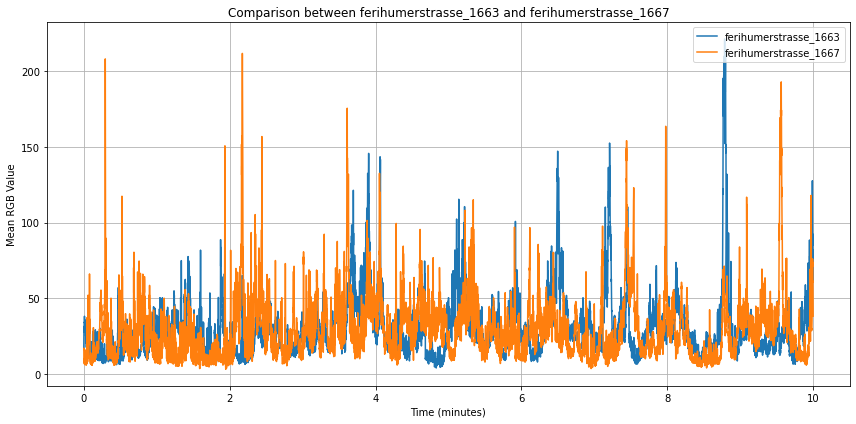

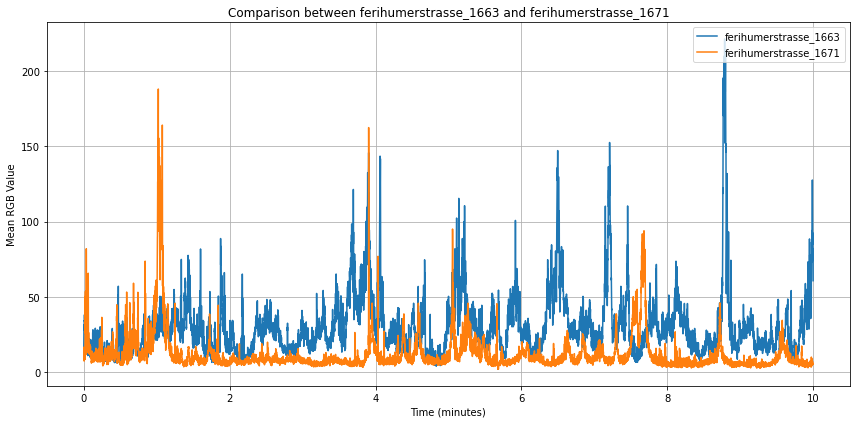

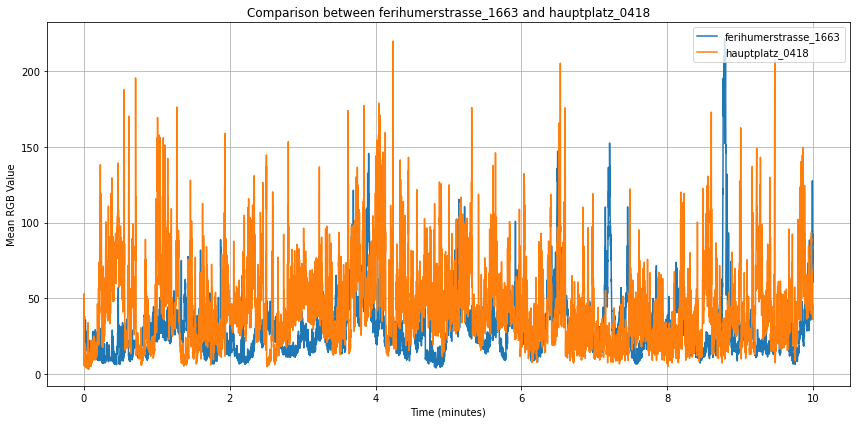

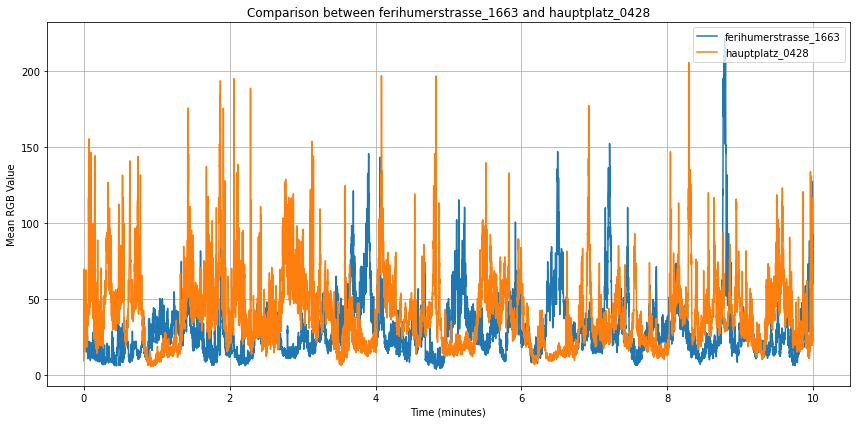

ValueError: x and y must have same first dimension, but have shapes (18000,) and (17400,)

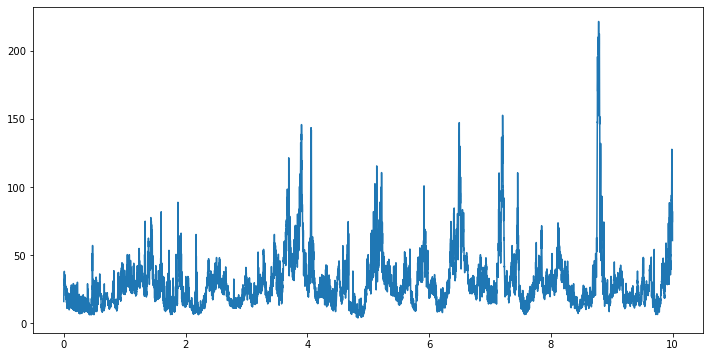

In [394]:
def plot_comparison(file1, file2, time_comparison=True):
    label1 = os.path.basename(file1).split("_", 1)[1].rsplit(".", 1)[0]
    label2 = os.path.basename(file2).split("_", 1)[1].rsplit(".", 1)[0]
    
    df1 = pickle.load(open(file1, 'rb'))
    df2 = pickle.load(open(file2, 'rb'))
    
    df1['mean_value'] = df1.mean(axis=1)
    df2['mean_value'] = df2.mean(axis=1)

    # Create a time axis for plotting
    times_in_minutes = np.arange(len(df1)) / 30 / 60  # assuming 30fps and converting to minutes

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(times_in_minutes, df1['mean_value'], label=f'{label1}')
    plt.plot(times_in_minutes, df2['mean_value'], label=f'{label2}')
    plt.legend(loc='upper right')
    plt.xlabel("Time (minutes)")
    plt.ylabel("Mean RGB Value")
    plt.title(f"Comparison between {label1} and {label2}")
    plt.tight_layout()
    plt.grid(True)
    
    if time_comparison:
        plt.savefig(f"./viz/comparison_time_{label1}_vs_{label2}.png", dpi=100)
    else:
        plt.savefig(f"./viz/comparison_district_{label1}_vs_{label2}.png", dpi=100)
    
    plt.show()


file_list = sorted(glob.glob('./pkl/tuned/dynamic_brightness/*.pkl'))

# Grouping files by districtname_videofilenumber
grouped_files = {}
for file in file_list:
    key = "_".join(os.path.basename(file).split("_")[2:-1])
    if key not in grouped_files:
        grouped_files[key] = []
    grouped_files[key].append(file)

# Plotting comparisons
for key, files in grouped_files.items():
    if len(files) == 2:
        # Time comparison (morning vs afternoon)
        plot_comparison(files[0], files[1], time_comparison=True)
    else:
        # District comparison (within the same time frame, for the given district)
        for i in range(len(files)):
            for j in range(i+1, len(files)):
                plot_comparison(files[i], files[j], time_comparison=False)

## Comparison by time and district

In [433]:
# Dictionary with video codes for each location
codes = {
    'ferihumerstrasse': {
        'afternoon': [1663, 1667, 1671],
        'morning': [3212, 3215, 3218]
    },
    'mozartkreuzung': {
        'afternoon': [3225, 3227, 3233],
        'morning': [7397, 7399, 7401]
    }
}

In [454]:
method = ['color_shift', 'pulsating_color']  # dynamic_brightness

m = method[0]
file_list = sorted(glob.glob(f'./pkl/tuned/{m}/*.pkl'))
file_list

['./pkl/tuned/color_shift/afternoon_ferihumerstrasse_1663.pkl',
 './pkl/tuned/color_shift/afternoon_ferihumerstrasse_1667.pkl',
 './pkl/tuned/color_shift/afternoon_ferihumerstrasse_1671.pkl',
 './pkl/tuned/color_shift/afternoon_hauptplatz_0418.pkl',
 './pkl/tuned/color_shift/afternoon_hauptplatz_0428.pkl',
 './pkl/tuned/color_shift/afternoon_hauptplatz_0431.pkl',
 './pkl/tuned/color_shift/afternoon_mozartkreuzung_3225.pkl',
 './pkl/tuned/color_shift/afternoon_mozartkreuzung_3227.pkl',
 './pkl/tuned/color_shift/afternoon_mozartkreuzung_3233.pkl',
 './pkl/tuned/color_shift/morning_ferihumerstrasse_3212.pkl',
 './pkl/tuned/color_shift/morning_ferihumerstrasse_3215.pkl',
 './pkl/tuned/color_shift/morning_ferihumerstrasse_3218.pkl',
 './pkl/tuned/color_shift/morning_hauptplatz_1632.pkl',
 './pkl/tuned/color_shift/morning_hauptplatz_1634.pkl',
 './pkl/tuned/color_shift/morning_hauptplatz_1642.pkl',
 './pkl/tuned/color_shift/morning_mozartkreuzung_7397.pkl',
 './pkl/tuned/color_shift/morning_

In [466]:
aft_feri = ['afternoon_ferihumerstrasse_1663', 
            'afternoon_ferihumerstrasse_1667', 
            'afternoon_ferihumerstrasse_1671']

aft_moza = ['afternoon_mozartkreuzung_3225', 
            'afternoon_mozartkreuzung_3227', 
            'afternoon_mozartkreuzung_3233']

morn_feri = ['morning_ferihumerstrasse_3212',
            'morning_ferihumerstrasse_3215',
            'morning_ferihumerstrasse_3218']

morn_moza = ['morning_mozartkreuzung_7397',
             'morning_mozartkreuzung_7399',
             'morning_mozartkreuzung_7401']

In [471]:
os.listdir('./pkl/rms')

['afternoon_ferihumerstrasse_1671.pkl',
 'morning_ferihumerstrasse_3218.pkl',
 'afternoon_ferihumerstrasse_1667.pkl',
 'afternoon_mozartkreuzung_3227.pkl',
 'afternoon_mozartkreuzung_3233.pkl',
 'afternoon_ferihumerstrasse_1663.pkl',
 'afternoon_hauptplatz_0428.pkl',
 'afternoon_mozartkreuzung_3225.pkl',
 'morning_mozartkreuzung_7399.pkl',
 'morning_mozartkreuzung_7401.pkl',
 'morning_hauptplatz_1642.pkl',
 'morning_mozartkreuzung_7397.pkl',
 'morning_ferihumerstrasse_3212.pkl',
 'morning_hauptplatz_1634.pkl',
 'afternoon_hauptplatz_0431.pkl',
 'afternoon_hauptplatz_0418.pkl',
 'morning_ferihumerstrasse_3215.pkl',
 'morning_hauptplatz_1632.pkl']

In [474]:
def load_and_avg_rgb(file_list, dir_path='./pkl/rms/'):
    avg_values = []
    for file in file_list:
        full_path = os.path.join(dir_path, file)
        rgb_data = pickle.load(open(full_path+'.pkl', 'rb'))
        avg_rgb = np.mean(rgb_data, axis=1) # Calculate mean RGB value for each frame
        avg_values.append(avg_rgb.mean()) # Calculate the average of averages
    return avg_values

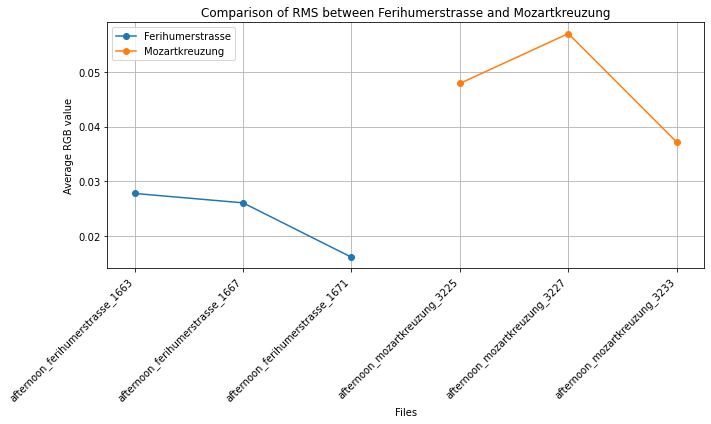

In [477]:
# Load and compute the average RGB for each set
avg_feri = load_and_avg_rgb(morn_feri)
avg_moza = load_and_avg_rgb(morn_moza)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(aft_feri, avg_feri, label='Ferihumerstrasse', marker='o')
plt.plot(aft_moza, avg_moza, label='Mozartkreuzung', marker='o')

plt.title("Comparison of RMS between Ferihumerstrasse and Mozartkreuzung")
plt.xlabel("Files")
plt.ylabel("Average RGB value")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.savefig('morning_rms_Fe rihumerstrasse and Mozartkreuzung.png', dpi=100)
plt.show()

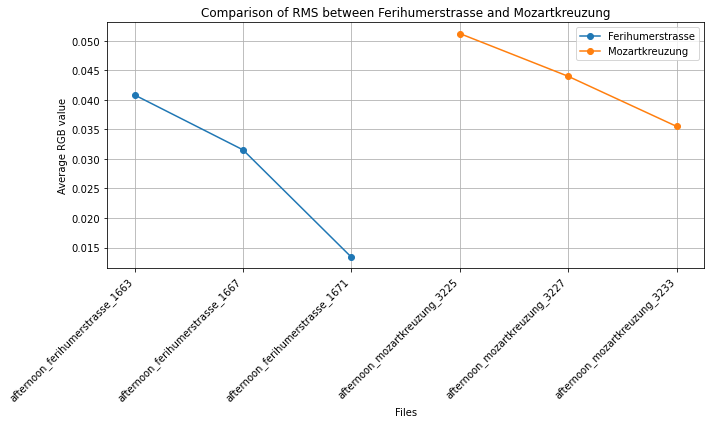

In [478]:
# Load and compute the average RGB for each set
avg_feri = load_and_avg_rgb(aft_feri)
avg_moza = load_and_avg_rgb(aft_moza)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(aft_feri, avg_feri, label='Ferihumerstrasse', marker='o')
plt.plot(aft_moza, avg_moza, label='Mozartkreuzung', marker='o')

plt.title("Comparison of RMS between Ferihumerstrasse and Mozartkreuzung")
plt.xlabel("Files")
plt.ylabel("Average RGB value")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.savefig('afternoon_rms_Ferihumerstrasse and Mozartkreuzung.png', dpi=100)
plt.show()

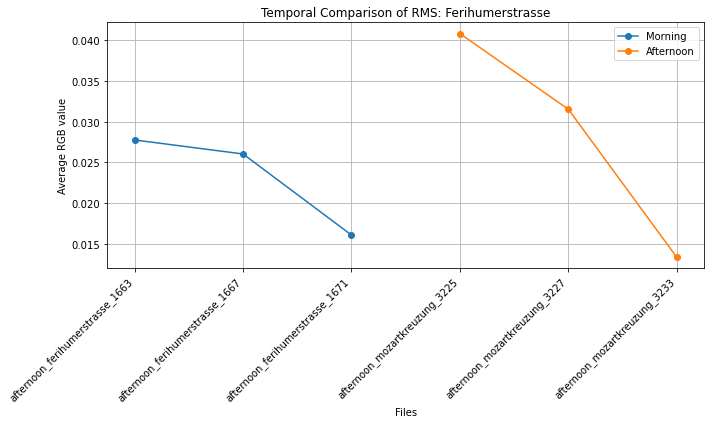

In [479]:
# Load and compute the average RGB for each set
avg_feri = load_and_avg_rgb(morn_feri)
avg_moza = load_and_avg_rgb(aft_feri)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(aft_feri, avg_feri, label='Morning', marker='o')
plt.plot(aft_moza, avg_moza, label='Afternoon', marker='o')

plt.title("Temporal Comparison of RMS: Ferihumerstrasse") #Mozartkreuzung
plt.xlabel("Files")
plt.ylabel("Average RGB value")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.savefig('temporal_RMS_Ferihumerstrasse.png', dpi=100)
plt.show()

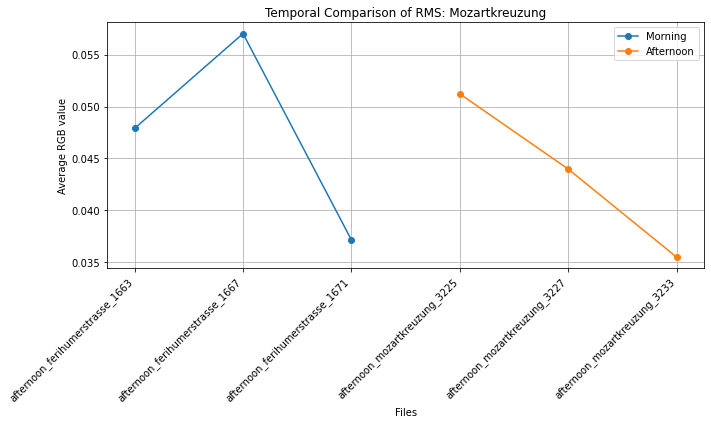

In [480]:
# Load and compute the average RGB for each set
avg_feri = load_and_avg_rgb(morn_moza)
avg_moza = load_and_avg_rgb(aft_moza)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(aft_feri, avg_feri, label='Morning', marker='o')
plt.plot(aft_moza, avg_moza, label='Afternoon', marker='o')

plt.title("Temporal Comparison of RMS: Mozartkreuzung")#Ferihumerstrasse") #Mozartkreuzung
plt.xlabel("Files")
plt.ylabel("Average RGB value")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.savefig('temporal_RMS_Mozartkreuzung.png', dpi=100)
plt.show()

In [411]:
def load_data_from_file(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

def calculate_mean_rgb(df):
    return df.mean(axis=1)

'mozartkreuzung_7401'

# Difference

In [487]:
rms_path = './pkl/rms/'

In [488]:
glob.glob(rms_path+'*')

['./pkl/rms/afternoon_ferihumerstrasse_1671.pkl',
 './pkl/rms/morning_ferihumerstrasse_3218.pkl',
 './pkl/rms/afternoon_ferihumerstrasse_1667.pkl',
 './pkl/rms/afternoon_mozartkreuzung_3227.pkl',
 './pkl/rms/afternoon_mozartkreuzung_3233.pkl',
 './pkl/rms/afternoon_ferihumerstrasse_1663.pkl',
 './pkl/rms/afternoon_hauptplatz_0428.pkl',
 './pkl/rms/afternoon_mozartkreuzung_3225.pkl',
 './pkl/rms/morning_mozartkreuzung_7399.pkl',
 './pkl/rms/morning_mozartkreuzung_7401.pkl',
 './pkl/rms/morning_hauptplatz_1642.pkl',
 './pkl/rms/morning_mozartkreuzung_7397.pkl',
 './pkl/rms/morning_ferihumerstrasse_3212.pkl',
 './pkl/rms/morning_hauptplatz_1634.pkl',
 './pkl/rms/afternoon_hauptplatz_0431.pkl',
 './pkl/rms/afternoon_hauptplatz_0418.pkl',
 './pkl/rms/morning_ferihumerstrasse_3215.pkl',
 './pkl/rms/morning_hauptplatz_1632.pkl']

In [486]:
morn_moza, morn_feri, aft_moza, aft_feri

(['morning_mozartkreuzung_7397',
  'morning_mozartkreuzung_7399',
  'morning_mozartkreuzung_7401'],
 ['morning_ferihumerstrasse_3212',
  'morning_ferihumerstrasse_3215',
  'morning_ferihumerstrasse_3218'],
 ['afternoon_mozartkreuzung_3225',
  'afternoon_mozartkreuzung_3227',
  'afternoon_mozartkreuzung_3233'],
 ['afternoon_ferihumerstrasse_1663',
  'afternoon_ferihumerstrasse_1667',
  'afternoon_ferihumerstrasse_1671'])

In [489]:
pd.read_pickle('./pkl/rms/afternoon_mozartkreuzung_3225.pkl')



,RMS
0,0.022176
1,0.032172
2,0.052286
3,0.090491
4,0.123579
...,...
17995,0.032038
17996,0.034318
17997,0.043701
17998,0.053038


In [492]:
os.listdir('./pkl/norm')

['afternoon_ferihumerstrasse_1671.pkl',
 'morning_ferihumerstrasse_3218.pkl',
 'norm_morning_hauptplatz_1632.pkl',
 'afternoon_ferihumerstrasse_1667.pkl',
 'afternoon_mozartkreuzung_3227.pkl',
 'afternoon_mozartkreuzung_3233.pkl',
 'norm_afternoon_hauptplatz_0428.pkl',
 'afternoon_ferihumerstrasse_1663.pkl',
 'afternoon_hauptplatz_0428.pkl',
 'norm_morning_hauptplatz_1634.pkl',
 'afternoon_mozartkreuzung_3225.pkl',
 'norm_morning_mozartkreuzung_7401.pkl',
 'norm_morning_mozartkreuzung_7399.pkl',
 'morning_mozartkreuzung_7399.pkl',
 'morning_mozartkreuzung_7401.pkl',
 'norm_morning_ferihumerstrasse_3218.pkl',
 'norm_afternoon_mozartkreuzung_3233.pkl',
 'norm_afternoon_mozartkreuzung_3227.pkl',
 'norm_morning_hauptplatz_1642.pkl',
 'norm_afternoon_mozartkreuzung_3225.pkl',
 'norm_morning_ferihumerstrasse_3212.pkl',
 'morning_hauptplatz_1642.pkl',
 'norm_morning_mozartkreuzung_7397.pkl',
 'norm_morning_ferihumerstrasse_3215.pkl',
 'morning_mozartkreuzung_7397.pkl',
 'morning_ferihumerstra

In [497]:
# Load the RMS data
filename = 'afternoon_mozartkreuzung_3225.pkl'
rms_data_path = f'./pkl/rms/{filename}'
rms_df = pickle.load(open(rms_data_path, 'rb'))

rms_diff = rms_df.diff().abs()
max_change_index = rms_diff.idxmax()[0]
start_index = max_change_index - 15
end_index = max_change_index + 15
subset_df = rms_df.iloc[start_index:end_index]

# Load RGB data
rgb_data_path = f'./pkl/norm/{filename}'
rgb_df = pickle.load(open(rgb_data_path, 'rb'))

# Extract the relevant frames from the RGB data
rgb_subset_df = rgb_df.iloc[start_index:end_index]
overall_mean_rgb = rgb_subset_df.mean()
overall_mean_rgb = rgb_subset_df.mean().astype(int)

# Convert the average RGB values to a HEX color code
color_code = "#{:02x}{:02x}{:02x}".format(overall_mean_rgb['sum_R'], 
                                          overall_mean_rgb['sum_G'], 
                                          overall_mean_rgb['sum_B'])
print(color_code)


#d4cfd0


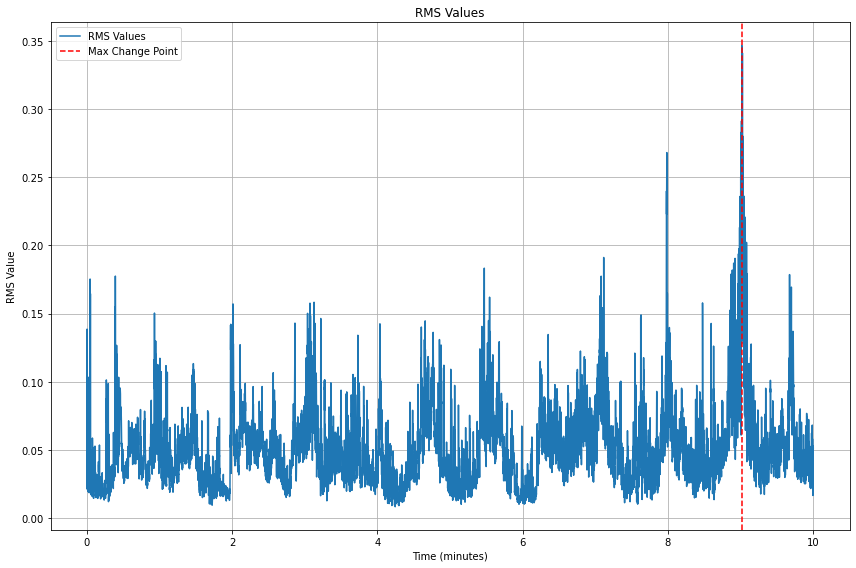

In [506]:
fps = 30  
conversion_factor = fps * 60  # Convert frame index to minutes

# Convert frame indices to time in minutes for plotting
time_values = rms_df.index / conversion_factor
max_change_time = max_change_index / conversion_factor

plt.figure(figsize=(12, 8))
plt.plot(time_values, rms_df.values, label='RMS Values', linestyle='-')
plt.axvline(x=max_change_time, color='r', linestyle='--', label='Max Change Point')

plt.xlabel('Time (minutes)')
plt.ylabel('RMS Value')
plt.title('RMS Values')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Load the RMS data
filename = 'afternoon_mozartkreuzung_3225.pkl'
rms_data_path = f'./pkl/rms/{filename}'
rms_df = pickle.load(open(rms_data_path, 'rb'))

rms_diff = rms_df.diff().abs()
max_change_index = rms_diff.idxmax()[0]
start_index = max_change_index - 15
end_index = max_change_index + 15
subset_df = rms_df.iloc[start_index:end_index]

# Load RGB data
rgb_data_path = f'./pkl/norm/{filename}'
rgb_df = pickle.load(open(rgb_data_path, 'rb'))

# Extract the relevant frames from the RGB data
rgb_subset_df = rgb_df.iloc[start_index:end_index]
overall_mean_rgb = rgb_subset_df.mean()
overall_mean_rgb = rgb_subset_df.mean().astype(int)

# Convert the average RGB values to a HEX color code
color_code = "#{:02x}{:02x}{:02x}".format(overall_mean_rgb['sum_R'], 
                                          overall_mean_rgb['sum_G'], 
                                          overall_mean_rgb['sum_B'])

fps = 29 if rgb_df.shape[0] % 29 == 0 else 30
if fps == 29:
    rms_df = resample_dataframe(rms_df, 17400)
conversion_factor = fps * 60

# Convert frame indices to time in minutes for plotting
time_values = rms_df.index / conversion_factor
max_change_time = max_change_index / conversion_factor

plt.figure(figsize=(12, 8))
plt.plot(time_values, rms_df.values, label='RMS Values', linestyle='-')
plt.axvline(x=max_change_time, color='r', linestyle='--', label='Max Change Point')

plt.xlabel('Time (minutes)')
plt.ylabel('RMS Value')
plt.title('RMS Values')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefigs(, dpi=100)
plt.show()

## final

FileNotFoundError: [Errno 2] No such file or directory: './plots/morning_ferihumerstrasse_3212.png'

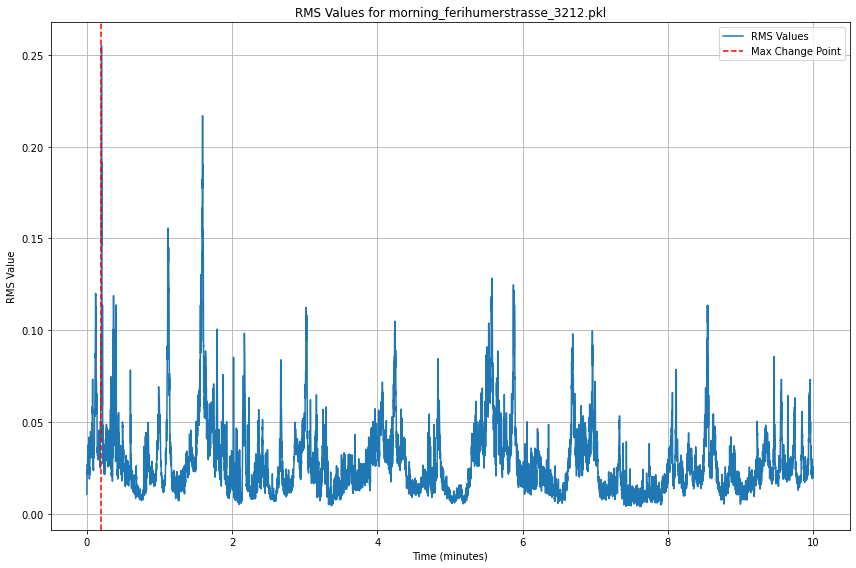

In [517]:
def plot_rms_and_get_color(file_name):
    # Load the RMS data
    rms_data_path = f'./pkl/rms/{file_name}'
    rms_df = pickle.load(open(rms_data_path, 'rb'))
    
    rms_diff = rms_df.diff().abs()
    max_change_index = rms_diff.idxmax()[0]
    start_index = max_change_index
    end_index = max_change_index + 30
    subset_df = rms_df.iloc[start_index:end_index]

    # Load RGB data
    rgb_data_path = f'./pkl/norm/{file_name}'
    rgb_df = pickle.load(open(rgb_data_path, 'rb'))

    # Extract the relevant frames from the RGB data
    rgb_subset_df = rgb_df.iloc[start_index:end_index]
    overall_mean_rgb = rgb_subset_df.mean().astype(int)

    # Convert the average RGB values to a HEX color code
    color_code = "#{:02x}{:02x}{:02x}".format(overall_mean_rgb['sum_R'], 
                                              overall_mean_rgb['sum_G'], 
                                              overall_mean_rgb['sum_B'])

    fps = 30  
    conversion_factor = fps * 60

    # Convert frame indices to time in minutes for plotting
    time_values = rms_df.index / conversion_factor
    max_change_time = max_change_index / conversion_factor

    plt.figure(figsize=(12, 8))
    plt.plot(time_values, rms_df.values, label='RMS Values', linestyle='-')
    plt.axvline(x=max_change_time, color='r', linestyle='--', label='Max Change Point')

    plt.xlabel('Time (minutes)')
    plt.ylabel('RMS Value')
    plt.title(f'RMS Values for {file_name}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"./plots/{file_name.split('.')[0]}.png", dpi=100)
    plt.show()
    
    return color_code

# Files to process
files = [
    'morning_ferihumerstrasse_3212.pkl',
    'norm_afternoon_ferihumerstrasse_1663.pkl',
    'morning_hauptplatz_1634.pkl'
]

# Iterate over the files, plot and get color codes
for file in files:
    color = plot_rms_and_get_color(file)
    print(f"Color for {file}: {color}")


In [8]:
def plot_rms_and_get_color(file_name):
    # Load RGB data
    rgb_data_path = f'./pkl/norm/{file_name}'
    rgb_df = pickle.load(open(rgb_data_path, 'rb'))
    
    # Load the RMS data
    rms_data_path = f'./pkl/rms/{file_name}'
    rms_df = pickle.load(open(rms_data_path, 'rb'))

    fps = 29 if rgb_df.shape[0] % 29 == 0 else 30
    if fps == 29:
        rms_df = resample_dataframe(rms_df, 17400)
        
    rms_diff = rms_df.diff().abs()
    max_change_index = rms_diff.idxmax()[0]
    start_index = max_change_index - fps
    end_index = max_change_index + fps
    subset_df = rms_df.iloc[start_index:end_index]



    # Extract the relevant frames from the RGB data
    rgb_subset_df = rgb_df.iloc[start_index:end_index]
    overall_mean_rgb = rgb_subset_df.mean().astype(int)

    # Convert the average RGB values to a HEX color code
    color_code = "#{:02x}{:02x}{:02x}".format(overall_mean_rgb['sum_R'], 
                                              overall_mean_rgb['sum_G'], 
                                              overall_mean_rgb['sum_B'])



    conversion_factor = fps * 60

    # Convert frame indices to time in minutes for plotting
    time_values = rms_df.index / conversion_factor
    max_change_time = max_change_index / conversion_factor

    plt.figure(figsize=(12, 4))
    plt.plot(time_values, rms_df.values, label='RMS Values', linestyle='-')
    plt.axvline(x=max_change_time, color='r', linestyle='--', label='Max Change Point')

    plt.xlabel('Time (minutes)')
    plt.ylabel('RMS Value')
    plt.title(f"RMS Values for {file_name.split('.')[0]}: {color_code}")
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"./color/{file_name.split('.')[0]}_{color_code}.png", dpi=100)
    plt.show()
    
    # return color_code


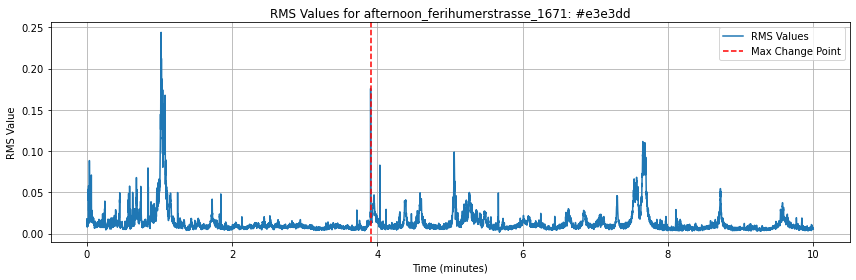

Color for afternoon_ferihumerstrasse_1671.pkl: None


NameError: name 'resample_dataframe' is not defined

In [9]:
files = os.listdir('./pkl/rms')
for file in files:
    color = plot_rms_and_get_color(file)
    print(f"Color for {file}: {color}")

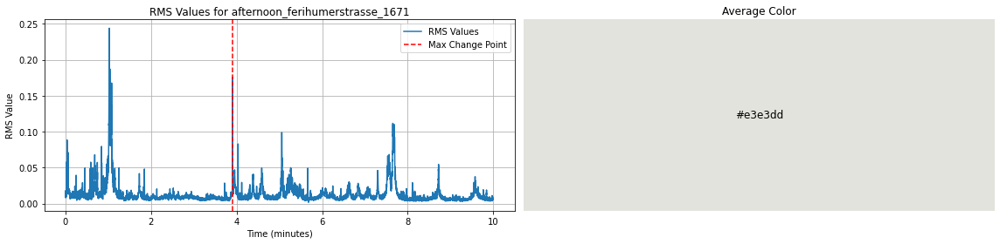

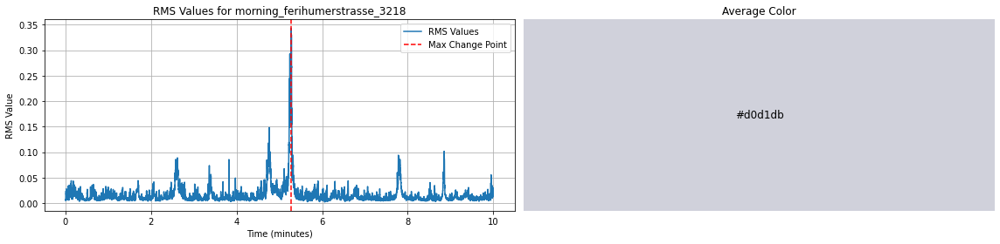

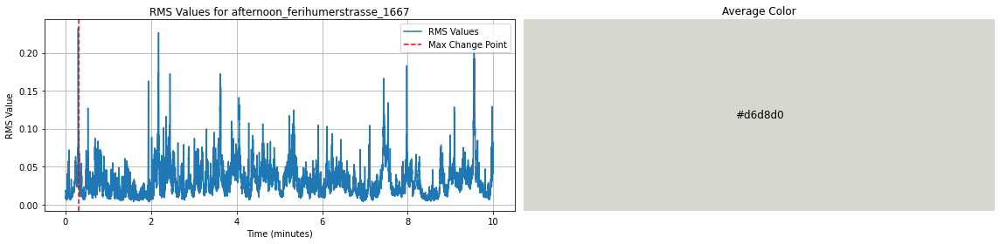

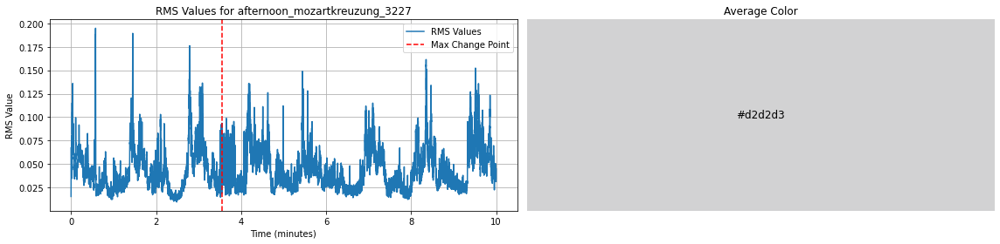

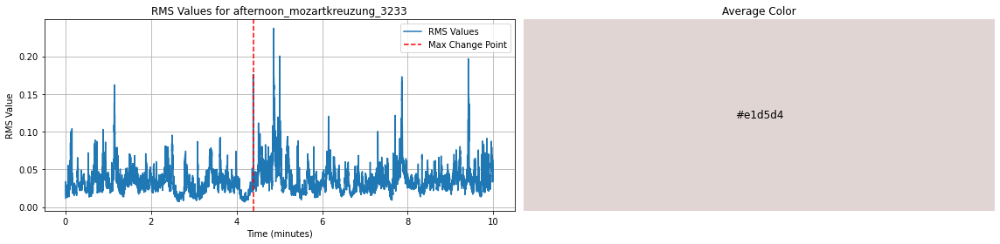

...

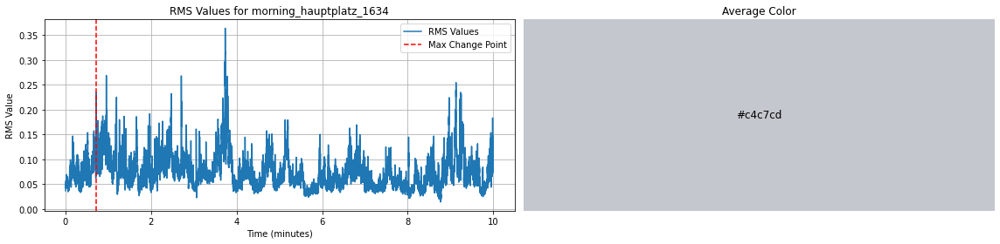

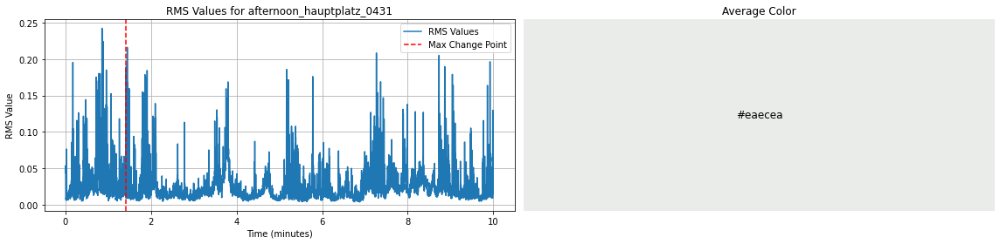

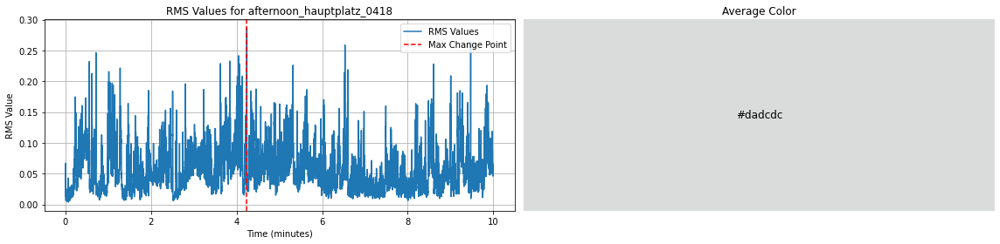

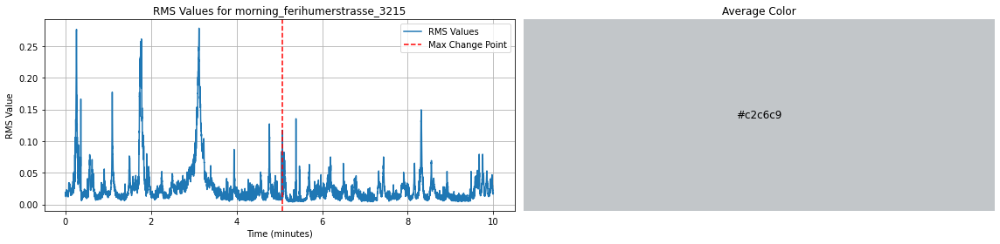

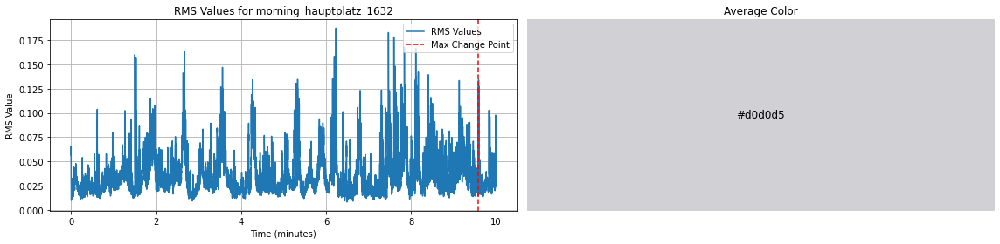

In [536]:
def plot_rms_and_get_color(file_name):
    # Load RGB data
    rgb_data_path = f'./pkl/norm/{file_name}'
    rgb_df = pickle.load(open(rgb_data_path, 'rb'))

    # Load the RMS data
    rms_data_path = f'./pkl/rms/{file_name}'
    rms_df = pickle.load(open(rms_data_path, 'rb'))

    fps = 29 if rgb_df.shape[0] % 29 == 0 else 30
    if fps == 29:
        rms_df = resample_dataframe(rms_df, 17400)

    rms_diff = rms_df.diff().abs()
    max_change_index = rms_diff.idxmax()[0]
    start_index = max_change_index - fps
    end_index = max_change_index + fps
    subset_df = rms_df.iloc[start_index:end_index]

    # Extract the relevant frames from the RGB data
    rgb_subset_df = rgb_df.iloc[start_index:end_index]
    overall_mean_rgb = rgb_subset_df.mean().astype(int)

    # Convert the average RGB values to a HEX color code
    color_code = "#{:02x}{:02x}{:02x}".format(overall_mean_rgb['sum_R'], 
                                              overall_mean_rgb['sum_G'], 
                                              overall_mean_rgb['sum_B'])

    conversion_factor = fps * 60

    # Convert frame indices to time in minutes for plotting
    time_values = rms_df.index / conversion_factor
    max_change_time = max_change_index / conversion_factor

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 4))
    
    # RMS plot on the left subplot
    ax1.plot(time_values, rms_df.values, label='RMS Values', linestyle='-')
    ax1.axvline(x=max_change_time, color='r', linestyle='--', label='Max Change Point')
    ax1.set_xlabel('Time (minutes)')
    ax1.set_ylabel('RMS Value')
    ax1.set_title(f"RMS Values for {file_name.split('.')[0]}")
    ax1.legend(loc='upper right')
    ax1.grid(True)
    
    # Color square on the right subplot
    ax2.axis('off')  # Turn off the axis
    ax2.add_patch(patches.Rectangle((0, 0), 1, 1, facecolor=color_code))
    ax2.text(0.5, 0.5, color_code, ha='center', va='center', fontsize=12, color='white' if sum(overall_mean_rgb) < 380 else 'black')
    ax2.set_title('Average Color')
    
    plt.tight_layout()
    plt.savefig(f"./color/{file_name.split('.')[0]}_{color_code}.png", dpi=100)
    plt.show()


for file in files:
    color = plot_rms_and_get_color(file)